In [1]:
%matplotlib inline


import numpy as np
import copy
import matplotlib.pyplot as plt
import pickle
import random
import torch
from utils import torch_from_numpy
import datetime

seed = 0


bif_c = 0.1
num_iter_max=200000
# alpha=0.2
alpha=0.3
# alpha=0.5
# alpha=0.8 # predict diverge
# vae_lr=1e-5
vae_lr=5e-4
ratio_lr=5e-4
ratio_early=100
env_name = 'CustomPendulum-v0'
env_str="pendulum"
figfilenamehead = "fig_policy_optimization_pendulum_A_"

loss_list = []
normalized_loss_list = []

In [2]:
import gym
import custom_gym
env = gym.make(env_name)

env.seed(seed)
env.action_space.seed(seed)
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

s_dim = env.reset().flatten().shape[0]
a_dim = env.action_space.sample().flatten().shape[0]
z_dim = 1
print(s_dim, a_dim, z_dim)



c = 0.21455680991172585
2 1 1


/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/core.py:329: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:174: UserWarning: WARN: Future gym versions will require that `Env.reset` can be passed a `seed` instead of using `Env.seed` for resetting the environment random number generator.
  logger.warn(
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site

In [3]:


from sac import SAC
# agent = SAC(env.observation_space.shape[0], env.action_space)
agent = SAC(env.observation_space.shape[0]+z_dim*2, env.action_space)
agent.load_checkpoint(ckpt_path="checkpoints/sac_checkpoint_custom_"+env_str+"_bamdp_standardvae_")


offline_data = pickle.load(open("offline_data_"+env_str+".pkl","rb"))
debug_info = pickle.load(open("offline_data_debug_info_"+env_str+".pkl","rb"))
debug_info = np.array(debug_info)

Loading models from checkpoints/sac_checkpoint_custom_pendulum_bamdp_standardvae_


In [4]:
args_init_dict = {
    "offline_data": offline_data,
    "s_dim": s_dim,
    "a_dim": a_dim,
    "z_dim": z_dim,
    #              "policy":agent.select_action,
    "mdp_policy":None,
    "bamdp_policy":agent.policy.my_np_select_action,
    "debug_info":debug_info,
    "env" : env,
    "ckpt_suffix" : env_str
}
# import vi_base
# vi = vi_base.baseVI(args_init_dict)
import vi_iw
iwvi = vi_iw.iwVI(args_init_dict)

iwvi.load_base()
iwvi.update_mulogvar_offlinedata()

load vi_base_ckpt


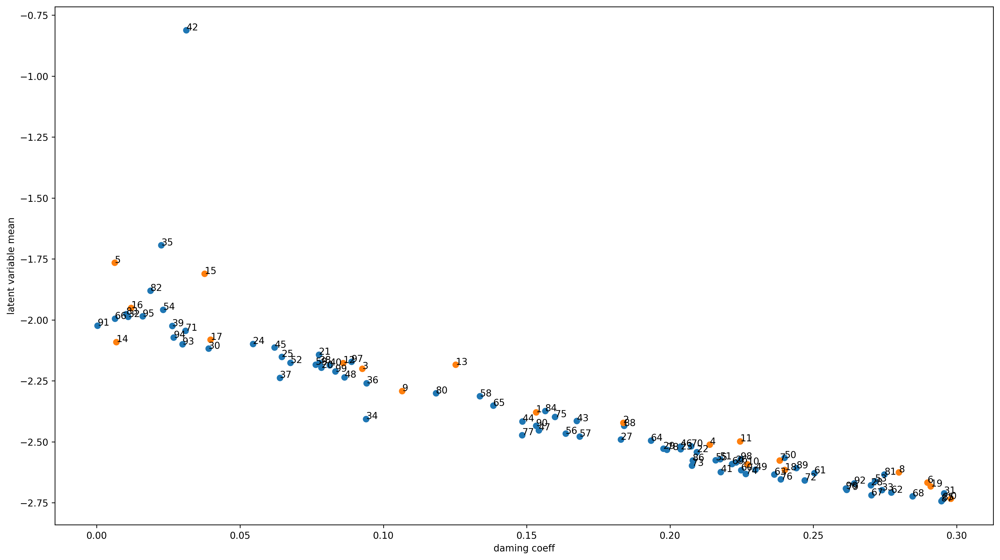

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [5]:
plt.figure(figsize=(18,10), dpi=250)
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()
plt.xlabel("daming coeff")
plt.ylabel("latent variable mean")

plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.xlim([-0.05,0.35])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_"+env_str+"_iter0.png")
plt.savefig(figfilenamehead+"damping_latent_"+env_str+"_iter0.eps")
plt.savefig(figfilenamehead+"damping_latent_"+env_str+"_iter0.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.xlim([0.06,0.14])
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [6]:
iwvi.get_real_rollout_bamdppolicy_data()


 0 9.5367431640625e-07
c = 0.16346495489906906


/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:227: DeprecationWarning: WARN: Core environment is written in old step API which returns one bool instead of two. It is recommended to rewrite the environment with new step API. 
  logger.deprecation(
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:233: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(done, (bool, np.bool8)):
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:141: UserWarning: WARN: The obs returned by the `step()` method was expecting numpy array dtype to be float32, actual type: float64
  logger.warn(
/home/thishinuma/anaconda3/envs/iwvi/lib/python3.8/site-packages/gym/utils/passive_env_checker.py:165: UserWarning: WARN: The obs returned by the `step()` method is not within the observation space.
  logger.warn(f


 1 4.909698247909546
c = 0.175923049855898

 2 5.007258176803589
c = 0.213101048692264

 3 6.009024620056152
c = 0.14501806056071762

 4 7.879191637039185
c = 0.004052611988015664

 5 4.871711015701294
c = 0.120134560420777

 6 7.776022672653198
c = 0.25697024030079035

 7 7.937405109405518
c = 0.09642657758269942

 8 4.377597808837891
c = 0.05526129195564814

 9 3.8588192462921143
c = 0.11417486037608537

 10 4.28816819190979
c = 0.25864988011260814

 11 8.557603120803833
c = 0.020876132555705383

 12 8.8061203956604
c = 0.2613891486606151

 13 5.673167943954468
c = 0.10624180953664825

 14 6.252384662628174
c = 0.03203027777652895

 15 5.2731544971466064
c = 0.1622476552961531

 16 3.5315067768096924
c = 0.1618277342655034

 17 3.3881287574768066
c = 0.055320312028603325

 18 3.5229101181030273
c = 0.09391364165595244

 19 3.5458383560180664
c = 0.11885913261799258

 20 3.804950714111328
c = 0.11403897859981632

 21 4.392518520355225
c = 0.09912067121474619

 22 3.320755958557129
c 

In [7]:
# fig = plt.figure(figsize=(18,10))
# ax_list = []
# for i in range(50):
#     ax_list.append(fig.add_subplot(5, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1]) 
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1]) 
# print("オフラインデータvs実環境方策rollout")


 0 7.152557373046875e-07
c = 0.20021770810986864

 1 5.508309364318848
c = 0.1983582812192558

 2 5.3494086265563965
c = 0.022555950291700478

 3 4.80216383934021
c = 0.20541677419620874

 4 4.032052516937256
c = 0.10100278390403257

 5 3.6666061878204346
c = 0.18626578567738697

 6 4.891888618469238
c = 0.05051976271514567

 7 4.939860820770264
c = 0.047219332290270255

 8 4.152682781219482
c = 0.1703964189334006

 9 8.820240497589111
c = 0.14840815680292022

 10 4.83834981918335
c = 0.24494872822400177

 11 3.569885730743408
c = 0.025342155733352467

 12 3.67829966545105
c = 0.29120495159551035

 13 4.903284549713135
c = 0.1062823595846313

 14 5.176807641983032
c = 0.2005682341251094

 15 9.482588291168213
c = 0.2575002131665844

 16 7.27705454826355
c = 0.2478069086585581

 17 5.554604768753052
c = 0.10556652164894924

 18 4.500380039215088
c = 0.1263102409001565

 19 4.40968656539917
c = 0.06421935796424785

 20 5.955671548843384
c = 0.162199131307732

 21 9.380981922149658
c = 0


 75 5.21904730796814
c = 0.19400590626826322

 76 6.798511266708374
c = 0.2672795379972454

 77 4.090008497238159
c = 0.029065835958021

 78 3.767937660217285
c = 0.2245722921775796

 79 4.9919188022613525
c = 0.1051746907010319

 80 4.201840877532959
c = 0.13874576836122632

 81 4.617009878158569
c = 0.29309690014830886

 82 3.7481398582458496
c = 0.07047958108149714

 83 5.561683177947998
c = 0.08601192491679845

 84 4.556190013885498
c = 0.06872835951049482

 85 6.220832347869873
c = 0.11532561558742395

 86 3.840285062789917
c = 0.04002030948199862

 87 4.287755489349365
c = 0.24862906093642148

 88 3.794612169265747
c = 0.017403030470802182

 89 4.090212821960449
c = 0.16351090672440727

 90 3.6815555095672607
c = 0.08953965430239402

 91 4.243580341339111
c = 0.0517091874600617

 92 4.396330833435059
c = 0.18516421320066853

 93 4.084603786468506
c = 0.19422658353964023

 94 4.1569108963012695
c = 0.06961774284821265

 95 3.6499745845794678
c = 0.06871189431752674

 96 4.5860133

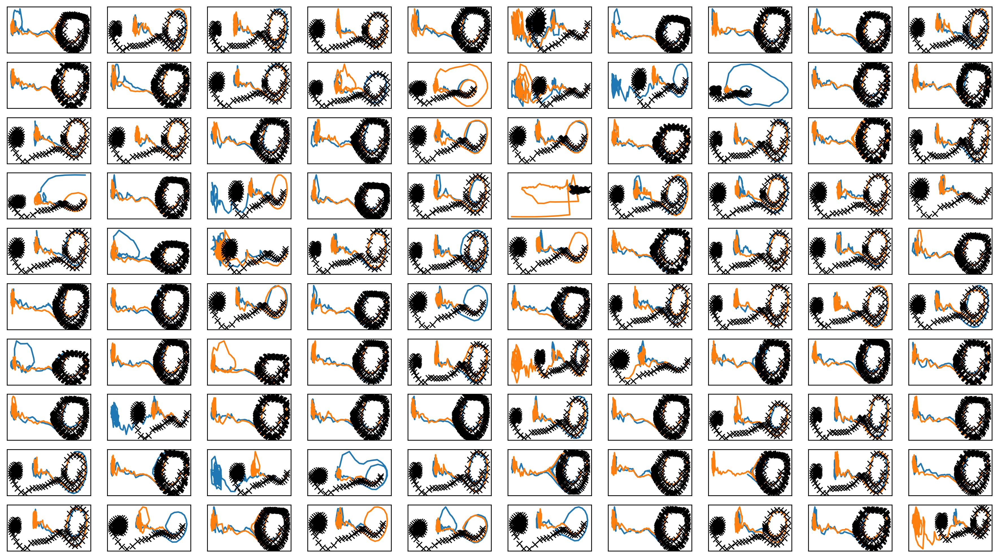

In [8]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"iter0.png")
plt.savefig(figfilenamehead+"iter0.pdf")
plt.savefig(figfilenamehead+"iter0.eps")
print("実環境方策rollout vs Sim環境方策rollout")

In [9]:
print(datetime.datetime.now())

2023-04-12 14:00:27.436544


# Iter 1

In [10]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()


 0
c = 0.03464867600121667
c = 0.19450087808765032
c = 0.19301131049065876
c = 0.08185199197896266
c = 0.08949613297763705
c = 0.20437448769648292
c = 0.15751979922690335
c = 0.04614580029029231
c = 0.20665544024725171
c = 0.15937295172801383
c = 0.17342040368093561
c = 0.04836863428962355
c = 0.274521190358213
c = 0.02034496822062862
c = 0.25297060502823726

 1
c = 0.200940134275056
c = 0.2347563158261987
c = 0.2936818277427159
c = 0.17751368760064776
c = 0.011643519404071457
c = 0.2740239681055151
c = 0.08488486393905613
c = 0.17435711121444594
c = 0.0726675563712439
c = 0.2546306177603635
c = 0.03968970746859892
c = 0.016523486534701693
c = 0.2731708041734273

 2
c = 0.1568017789328231
c = 0.174978767540895
c = 0.2311230841030097
c = 0.21802047459395227
c = 0.08083387282441379
c = 0.008418015728813776
c = 0.12591504428290362
c = 0.07111136407607056
c = 0.1504897537947867

 3
c = 0.06660573816820654
c = 0.12246551153914187
c = 0.27334588157538986
c = 0.0893573687594212
c = 0.1740167

c = 0.10222543094863261
c = 0.19152714727103518
c = 0.0769379589385979
c = 0.2910003532276938
c = 0.27877596865557597
c = 0.057685725059672774
c = 0.04712438240320027
c = 0.11808358299180789
c = 0.05960861398170013
c = 0.29636593628841085
c = 0.030238594689622065
c = 0.10117895294252273
c = 0.03485137439360535
c = 0.10664801346465146
c = 0.20795357491001912
c = 0.11247466396331308

 28
c = 0.16381931429840188
c = 0.0695832887328988
c = 0.12219187386266589
c = 0.008973768325693531
c = 0.04192773955017985
c = 0.26128486726971417
c = 0.029163086977727425
c = 0.14824945700096726
c = 0.2797126233592532
c = 0.18504940047744667

 29
c = 0.28749826150397584
c = 0.08624279846333432
c = 0.038748741962332287
c = 0.17656942554224261
c = 0.18199739081946023
c = 0.2890005594254393
c = 0.23924465469783066
c = 0.22548459178760655
c = 0.1052024986301608
c = 0.1780585968362085
c = 0.2949336713726248
c = 0.13959848627763163
c = 0.1878165513521339
c = 0.017976710452915424

 30
c = 0.016270459445828753
c =

c = 0.13796689995500758
c = 0.2378337158613498
c = 0.2257496966354935
c = 0.24892967984995137
c = 0.09051203225603578

 55
c = 0.00579233372750354
c = 0.04459594470669852
c = 0.17257404566194512
c = 0.25852193723240424
c = 0.16722230480608616
c = 0.23444857109198583
c = 0.09314293068424812
c = 0.21521518419548716
c = 0.18947884113917798
c = 0.09159564560993884
c = 0.09592771784263564

 56
c = 0.07122731748020612
c = 0.2857984366072217
c = 0.22077103358004843
c = 0.293126003439726
c = 0.1781693507229692
c = 0.09057533253471271
c = 0.06857910837067051
c = 0.10553747126355452
c = 0.2004259430547742
c = 0.006921779728811528

 57
c = 0.10945619520413713
c = 0.04449532911366222
c = 0.20942661339036558
c = 0.1162589281274065
c = 0.20541062081401398
c = 0.10058717144489344
c = 0.2976616704276628
c = 0.1245804790027051
c = 0.11173996438684593
c = 0.025802661721826336

 58
c = 0.1267507883908812
c = 0.18415375419039168
c = 0.010414770294954533
c = 0.015367395847501696
c = 0.07589929843478131
c =

c = 0.06441491699783476

 80
c = 0.014936174599524697
c = 0.20819861344263396
c = 0.12973951393706973
c = 0.2470975096996037
c = 0.26247661976936365
c = 0.04501277860083199
c = 0.17552326610585045
c = 0.040693726593650344
c = 0.1415351157711353
c = 0.026975455430199913
c = 0.12272434188946726
c = 0.2832256235920439
c = 0.0013527802643164555
c = 0.23071288973593987
c = 0.2364471732302442
c = 0.14938546433763328
c = 0.1308033508560351

 81
c = 0.19197882532182983
c = 0.015598383486750654
c = 0.2752044780998223
c = 0.09734956308106064
c = 0.2336840754913897
c = 0.09918057465154298
c = 0.1225061972085022
c = 0.21915695012497657
c = 0.04355228064269329
c = 0.19132648924040743
c = 0.2408768593613479

 82
c = 0.29661861758776675
c = 0.18698516671596702
c = 0.1345255422150572
c = 0.0882629416939045
c = 0.17512579948612667
c = 0.05195341148438985
c = 0.1903772710494892
c = 0.027531133633453442
c = 0.25559084282086825
c = 0.250106015474825
c = 0.2909715711171254
c = 0.1125331072267363
c = 0.2670

In [11]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


train: iter 0  trainloss 1.25639  validloss 1.35279±0.00000  bestvalidloss 1.35279  last_update 0
train: iter 1  trainloss 0.97768  validloss 1.11111±0.00000  bestvalidloss 1.11111  last_update 0
train: iter 2  trainloss 0.79982  validloss 0.81543±0.00000  bestvalidloss 0.81543  last_update 0
train: iter 3  trainloss 0.75305  validloss 0.72339±0.00000  bestvalidloss 0.72339  last_update 0
train: iter 4  trainloss 0.73393  validloss 0.69599±0.00000  bestvalidloss 0.69599  last_update 0
train: iter 5  trainloss 0.72191  validloss 0.68444±0.00000  bestvalidloss 0.68444  last_update 0
train: iter 6  trainloss 0.71287  validloss 0.67070±0.00000  bestvalidloss 0.67070  last_update 0
train: iter 7  trainloss 0.70373  validloss 0.66182±0.00000  bestvalidloss 0.66182  last_update 0
train: iter 8  trainloss 0.69537  validloss 0.65477±0.00000  bestvalidloss 0.65477  last_update 0
train: iter 9  trainloss 0.68997  validloss 0.64536±0.00000  bestvalidloss 0.64536  last_update 0
train: iter 10  trai

train: iter 84  trainloss 0.45216  validloss 0.42106±0.00000  bestvalidloss 0.42106  last_update 0
train: iter 85  trainloss 0.45312  validloss 0.42063±0.00000  bestvalidloss 0.42063  last_update 0
train: iter 86  trainloss 0.45079  validloss 0.42643±0.00000  bestvalidloss 0.42063  last_update 1
train: iter 87  trainloss 0.44952  validloss 0.41713±0.00000  bestvalidloss 0.41713  last_update 0
train: iter 88  trainloss 0.44818  validloss 0.41711±0.00000  bestvalidloss 0.41711  last_update 0
train: iter 89  trainloss 0.44691  validloss 0.41788±0.00000  bestvalidloss 0.41711  last_update 1
train: iter 90  trainloss 0.44986  validloss 0.42289±0.00000  bestvalidloss 0.41711  last_update 2
train: iter 91  trainloss 0.44420  validloss 0.41566±0.00000  bestvalidloss 0.41566  last_update 0
train: iter 92  trainloss 0.44606  validloss 0.42069±0.00000  bestvalidloss 0.41566  last_update 1
train: iter 93  trainloss 0.44369  validloss 0.41489±0.00000  bestvalidloss 0.41489  last_update 0
train: ite

train: iter 168  trainloss 0.40323  validloss 0.37134±0.00000  bestvalidloss 0.37134  last_update 0
train: iter 169  trainloss 0.40320  validloss 0.37020±0.00000  bestvalidloss 0.37020  last_update 0
train: iter 170  trainloss 0.40468  validloss 0.38915±0.00000  bestvalidloss 0.37020  last_update 1
train: iter 171  trainloss 0.40585  validloss 0.37847±0.00000  bestvalidloss 0.37020  last_update 2
train: iter 172  trainloss 0.40310  validloss 0.37823±0.00000  bestvalidloss 0.37020  last_update 3
train: iter 173  trainloss 0.40064  validloss 0.37555±0.00000  bestvalidloss 0.37020  last_update 4
train: iter 174  trainloss 0.39782  validloss 0.38103±0.00000  bestvalidloss 0.37020  last_update 5
train: iter 175  trainloss 0.39873  validloss 0.36879±0.00000  bestvalidloss 0.36879  last_update 0
train: iter 176  trainloss 0.39963  validloss 0.37430±0.00000  bestvalidloss 0.36879  last_update 1
train: iter 177  trainloss 0.39941  validloss 0.36760±0.00000  bestvalidloss 0.36760  last_update 0


train: iter 252  trainloss 0.36502  validloss 0.35402±0.00000  bestvalidloss 0.35389  last_update 3
train: iter 253  trainloss 0.36288  validloss 0.35300±0.00000  bestvalidloss 0.35300  last_update 0
train: iter 254  trainloss 0.36447  validloss 0.35721±0.00000  bestvalidloss 0.35300  last_update 1
train: iter 255  trainloss 0.36386  validloss 0.36423±0.00000  bestvalidloss 0.35300  last_update 2
train: iter 256  trainloss 0.36543  validloss 0.35844±0.00000  bestvalidloss 0.35300  last_update 3
train: iter 257  trainloss 0.36164  validloss 0.35585±0.00000  bestvalidloss 0.35300  last_update 4
train: iter 258  trainloss 0.36233  validloss 0.35473±0.00000  bestvalidloss 0.35300  last_update 5
train: iter 259  trainloss 0.35964  validloss 0.35849±0.00000  bestvalidloss 0.35300  last_update 6
train: iter 260  trainloss 0.36063  validloss 0.35245±0.00000  bestvalidloss 0.35245  last_update 0
train: iter 261  trainloss 0.35990  validloss 0.34894±0.00000  bestvalidloss 0.34894  last_update 0


train: iter 336  trainloss 0.34185  validloss 0.34627±0.00000  bestvalidloss 0.33856  last_update 3
train: iter 337  trainloss 0.34193  validloss 0.34068±0.00000  bestvalidloss 0.33856  last_update 4
train: iter 338  trainloss 0.34891  validloss 0.35444±0.00000  bestvalidloss 0.33856  last_update 5
train: iter 339  trainloss 0.34713  validloss 0.34480±0.00000  bestvalidloss 0.33856  last_update 6
train: iter 340  trainloss 0.34565  validloss 0.34039±0.00000  bestvalidloss 0.33856  last_update 7
train: iter 341  trainloss 0.34088  validloss 0.33971±0.00000  bestvalidloss 0.33856  last_update 8
train: iter 342  trainloss 0.34497  validloss 0.34226±0.00000  bestvalidloss 0.33856  last_update 9
train: iter 343  trainloss 0.34175  validloss 0.34452±0.00000  bestvalidloss 0.33856  last_update 10
train: iter 344  trainloss 0.34011  validloss 0.35310±0.00000  bestvalidloss 0.33856  last_update 11
train: iter 345  trainloss 0.34167  validloss 0.34259±0.00000  bestvalidloss 0.33856  last_update 

train: iter 420  trainloss 0.33124  validloss 0.33273±0.00000  bestvalidloss 0.32920  last_update 6
train: iter 421  trainloss 0.33294  validloss 0.33566±0.00000  bestvalidloss 0.32920  last_update 7
train: iter 422  trainloss 0.33128  validloss 0.33008±0.00000  bestvalidloss 0.32920  last_update 8
train: iter 423  trainloss 0.33403  validloss 0.33181±0.00000  bestvalidloss 0.32920  last_update 9
train: iter 424  trainloss 0.33713  validloss 0.33036±0.00000  bestvalidloss 0.32920  last_update 10
train: iter 425  trainloss 0.33062  validloss 0.34321±0.00000  bestvalidloss 0.32920  last_update 11
train: iter 426  trainloss 0.32988  validloss 0.35232±0.00000  bestvalidloss 0.32920  last_update 12
train: iter 427  trainloss 0.33414  validloss 0.32871±0.00000  bestvalidloss 0.32871  last_update 0
train: iter 428  trainloss 0.32913  validloss 0.33209±0.00000  bestvalidloss 0.32871  last_update 1
train: iter 429  trainloss 0.33488  validloss 0.33470±0.00000  bestvalidloss 0.32871  last_update

train: iter 504  trainloss 0.32849  validloss 0.32593±0.00000  bestvalidloss 0.32214  last_update 16
train: iter 505  trainloss 0.32440  validloss 0.32681±0.00000  bestvalidloss 0.32214  last_update 17
train: iter 506  trainloss 0.32277  validloss 0.32847±0.00000  bestvalidloss 0.32214  last_update 18
train: iter 507  trainloss 0.32245  validloss 0.32751±0.00000  bestvalidloss 0.32214  last_update 19
train: iter 508  trainloss 0.32454  validloss 0.32854±0.00000  bestvalidloss 0.32214  last_update 20
train: iter 509  trainloss 0.32698  validloss 0.32820±0.00000  bestvalidloss 0.32214  last_update 21
train: iter 510  trainloss 0.32323  validloss 0.32564±0.00000  bestvalidloss 0.32214  last_update 22
train: iter 511  trainloss 0.32630  validloss 0.32584±0.00000  bestvalidloss 0.32214  last_update 23
train: iter 512  trainloss 0.32295  validloss 0.32707±0.00000  bestvalidloss 0.32214  last_update 24
train: iter 513  trainloss 0.32473  validloss 0.32965±0.00000  bestvalidloss 0.32214  last_

train: iter 588  trainloss 0.31945  validloss 0.33732±0.00000  bestvalidloss 0.31587  last_update 25
train: iter 589  trainloss 0.32339  validloss 0.32165±0.00000  bestvalidloss 0.31587  last_update 26
train: iter 590  trainloss 0.31671  validloss 0.33539±0.00000  bestvalidloss 0.31587  last_update 27
train: iter 591  trainloss 0.31870  validloss 0.32456±0.00000  bestvalidloss 0.31587  last_update 28
train: iter 592  trainloss 0.31831  validloss 0.32202±0.00000  bestvalidloss 0.31587  last_update 29
train: iter 593  trainloss 0.31874  validloss 0.33379±0.00000  bestvalidloss 0.31587  last_update 30
train: iter 594  trainloss 0.31812  validloss 0.32835±0.00000  bestvalidloss 0.31587  last_update 31
train: iter 595  trainloss 0.32041  validloss 0.34480±0.00000  bestvalidloss 0.31587  last_update 32
train: iter 596  trainloss 0.32037  validloss 0.32758±0.00000  bestvalidloss 0.31587  last_update 33
train: iter 597  trainloss 0.31873  validloss 0.32732±0.00000  bestvalidloss 0.31587  last_

train: iter 672  trainloss 0.31002  validloss 0.32691±0.00000  bestvalidloss 0.31325  last_update 34
train: iter 673  trainloss 0.30939  validloss 0.31216±0.00000  bestvalidloss 0.31216  last_update 0
train: iter 674  trainloss 0.31560  validloss 0.32310±0.00000  bestvalidloss 0.31216  last_update 1
train: iter 675  trainloss 0.31154  validloss 0.33281±0.00000  bestvalidloss 0.31216  last_update 2
train: iter 676  trainloss 0.31090  validloss 0.32073±0.00000  bestvalidloss 0.31216  last_update 3
train: iter 677  trainloss 0.31033  validloss 0.32175±0.00000  bestvalidloss 0.31216  last_update 4
train: iter 678  trainloss 0.31184  validloss 0.32086±0.00000  bestvalidloss 0.31216  last_update 5
train: iter 679  trainloss 0.31007  validloss 0.32439±0.00000  bestvalidloss 0.31216  last_update 6
train: iter 680  trainloss 0.31225  validloss 0.33303±0.00000  bestvalidloss 0.31216  last_update 7
train: iter 681  trainloss 0.31523  validloss 0.32291±0.00000  bestvalidloss 0.31216  last_update 8

train: iter 756  trainloss 0.30837  validloss 0.31394±0.00000  bestvalidloss 0.31049  last_update 42
train: iter 757  trainloss 0.30405  validloss 0.31971±0.00000  bestvalidloss 0.31049  last_update 43
train: iter 758  trainloss 0.30812  validloss 0.31445±0.00000  bestvalidloss 0.31049  last_update 44
train: iter 759  trainloss 0.30760  validloss 0.31406±0.00000  bestvalidloss 0.31049  last_update 45
train: iter 760  trainloss 0.30766  validloss 0.31341±0.00000  bestvalidloss 0.31049  last_update 46
train: iter 761  trainloss 0.30780  validloss 0.31501±0.00000  bestvalidloss 0.31049  last_update 47
train: iter 762  trainloss 0.30796  validloss 0.31190±0.00000  bestvalidloss 0.31049  last_update 48
train: iter 763  trainloss 0.30667  validloss 0.31210±0.00000  bestvalidloss 0.31049  last_update 49
train: iter 764  trainloss 0.30393  validloss 0.32144±0.00000  bestvalidloss 0.31049  last_update 50
train: iter 765  trainloss 0.30720  validloss 0.31040±0.00000  bestvalidloss 0.31040  last_

train: iter 840  trainloss 0.29866  validloss 0.33125±0.00000  bestvalidloss 0.30637  last_update 30
train: iter 841  trainloss 0.30319  validloss 0.31287±0.00000  bestvalidloss 0.30637  last_update 31
train: iter 842  trainloss 0.29799  validloss 0.31972±0.00000  bestvalidloss 0.30637  last_update 32
train: iter 843  trainloss 0.29971  validloss 0.31291±0.00000  bestvalidloss 0.30637  last_update 33
train: iter 844  trainloss 0.30153  validloss 0.30824±0.00000  bestvalidloss 0.30637  last_update 34
train: iter 845  trainloss 0.30202  validloss 0.31817±0.00000  bestvalidloss 0.30637  last_update 35
train: iter 846  trainloss 0.30262  validloss 0.32893±0.00000  bestvalidloss 0.30637  last_update 36
train: iter 847  trainloss 0.29725  validloss 0.31115±0.00000  bestvalidloss 0.30637  last_update 37
train: iter 848  trainloss 0.29937  validloss 0.32582±0.00000  bestvalidloss 0.30637  last_update 38
train: iter 849  trainloss 0.29946  validloss 0.31229±0.00000  bestvalidloss 0.30637  last_

train: iter 924  trainloss 0.29596  validloss 0.31634±0.00000  bestvalidloss 0.30205  last_update 15
train: iter 925  trainloss 0.29589  validloss 0.32130±0.00000  bestvalidloss 0.30205  last_update 16
train: iter 926  trainloss 0.29757  validloss 0.30387±0.00000  bestvalidloss 0.30205  last_update 17
train: iter 927  trainloss 0.30755  validloss 0.35243±0.00000  bestvalidloss 0.30205  last_update 18
train: iter 928  trainloss 0.29494  validloss 0.31172±0.00000  bestvalidloss 0.30205  last_update 19
train: iter 929  trainloss 0.29445  validloss 0.30877±0.00000  bestvalidloss 0.30205  last_update 20
train: iter 930  trainloss 0.29797  validloss 0.31109±0.00000  bestvalidloss 0.30205  last_update 21
train: iter 931  trainloss 0.29630  validloss 0.30556±0.00000  bestvalidloss 0.30205  last_update 22
train: iter 932  trainloss 0.29621  validloss 0.31442±0.00000  bestvalidloss 0.30205  last_update 23
train: iter 933  trainloss 0.29208  validloss 0.31013±0.00000  bestvalidloss 0.30205  last_

train: iter 1008  trainloss 0.29202  validloss 0.31581±0.00000  bestvalidloss 0.30205  last_update 99
train: iter 1009  trainloss 0.29185  validloss 0.31807±0.00000  bestvalidloss 0.30205  last_update 100
train: fin


In [12]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -203.33122740268706
valid_loss:  -225.8074440765381
train_loss:  -248.00583781361578
valid_loss:  -244.31095462560657


1e-08 1000.0


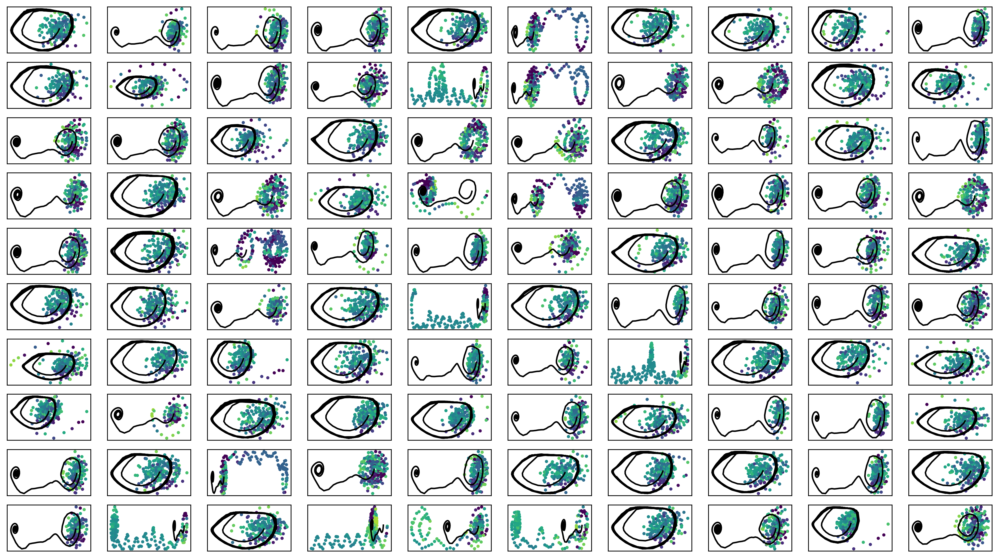

In [13]:

def f(x):
#     return x
    return np.log10(x)

fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter1.png")

In [14]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [15]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [16]:
# for i in range(100):
#     print(i, " ", end="")
#     fig = plt.figure(figsize=(16,10), dpi=150)
#     fig.patch.set_facecolor('white')
#     plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#                vmin=-8, vmax=3
#                )
#     plt.colorbar()
#     plt.savefig("ratio"+str(i)+".png")
#     plt.close()

train_weighted_vae: enc_dec
train: iter 0  trainloss -234.10607  validloss -246.09159±0.00000  bestvalidloss -246.09159  last_update 0
train: iter 1  trainloss -242.68634  validloss -238.12919±0.00000  bestvalidloss -246.09159  last_update 1
train: iter 2  trainloss -238.66283  validloss -225.79291±0.00000  bestvalidloss -246.09159  last_update 2
train: iter 3  trainloss -241.41498  validloss -244.27868±0.00000  bestvalidloss -246.09159  last_update 3
train: iter 4  trainloss -247.69751  validloss -241.22368±0.00000  bestvalidloss -246.09159  last_update 4
train: iter 5  trainloss -248.72322  validloss -232.57054±0.00000  bestvalidloss -246.09159  last_update 5
train: iter 6  trainloss -247.94039  validloss -250.07940±0.00000  bestvalidloss -250.07940  last_update 0
train: iter 7  trainloss -247.72173  validloss -242.43188±0.00000  bestvalidloss -250.07940  last_update 1
train: iter 8  trainloss -241.62959  validloss -248.15158±0.00000  bestvalidloss -250.07940  last_update 2
train: it

train: iter 76  trainloss -257.01243  validloss -252.34717±0.00000  bestvalidloss -256.48000  last_update 2
train: iter 77  trainloss -256.35009  validloss -255.25564±0.00000  bestvalidloss -256.48000  last_update 3
train: iter 78  trainloss -253.36652  validloss -252.00413±0.00000  bestvalidloss -256.48000  last_update 4
train: iter 79  trainloss -255.92395  validloss -252.07327±0.00000  bestvalidloss -256.48000  last_update 5
train: iter 80  trainloss -257.50925  validloss -253.23660±0.00000  bestvalidloss -256.48000  last_update 6
train: iter 81  trainloss -257.10851  validloss -240.70375±0.00000  bestvalidloss -256.48000  last_update 7
train: iter 82  trainloss -260.13963  validloss -255.73110±0.00000  bestvalidloss -256.48000  last_update 8
train: iter 83  trainloss -257.34099  validloss -233.98302±0.00000  bestvalidloss -256.48000  last_update 9
train: iter 84  trainloss -255.25878  validloss -250.25434±0.00000  bestvalidloss -256.48000  last_update 10
train: iter 85  trainloss -

train: iter 153  trainloss -261.78962  validloss -253.73447±0.00000  bestvalidloss -257.79244  last_update 47
train: iter 154  trainloss -263.86637  validloss -250.92065±0.00000  bestvalidloss -257.79244  last_update 48
train: iter 155  trainloss -263.17377  validloss -236.15911±0.00000  bestvalidloss -257.79244  last_update 49
train: iter 156  trainloss -256.01442  validloss -251.16721±0.00000  bestvalidloss -257.79244  last_update 50
train: iter 157  trainloss -264.70248  validloss -250.85333±0.00000  bestvalidloss -257.79244  last_update 51
train: iter 158  trainloss -265.43388  validloss -262.70455±0.00000  bestvalidloss -262.70455  last_update 0
train: iter 159  trainloss -249.77498  validloss -252.93173±0.00000  bestvalidloss -262.70455  last_update 1
train: iter 160  trainloss -262.55957  validloss -255.72347±0.00000  bestvalidloss -262.70455  last_update 2
train: iter 161  trainloss -265.23403  validloss -248.03810±0.00000  bestvalidloss -262.70455  last_update 3
train: iter 16

train: iter 228  trainloss -270.93170  validloss -267.29351±0.00000  bestvalidloss -267.29351  last_update 0
train: iter 229  trainloss -273.73074  validloss -268.41140±0.00000  bestvalidloss -268.41140  last_update 0
train: iter 230  trainloss -255.72132  validloss -227.97001±0.00000  bestvalidloss -268.41140  last_update 1
train: iter 231  trainloss -264.03615  validloss -255.35019±0.00000  bestvalidloss -268.41140  last_update 2
train: iter 232  trainloss -270.19641  validloss -255.78762±0.00000  bestvalidloss -268.41140  last_update 3
train: iter 233  trainloss -272.05586  validloss -249.76590±0.00000  bestvalidloss -268.41140  last_update 4
train: iter 234  trainloss -268.45005  validloss -253.29138±0.00000  bestvalidloss -268.41140  last_update 5
train: iter 235  trainloss -271.05106  validloss -245.80726±0.00000  bestvalidloss -268.41140  last_update 6
train: iter 236  trainloss -271.28779  validloss -253.66218±0.00000  bestvalidloss -268.41140  last_update 7
train: iter 237  tr

train: iter 304  trainloss -270.10392  validloss -239.62077±0.00000  bestvalidloss -268.41140  last_update 75
train: iter 305  trainloss -274.97654  validloss -261.19057±0.00000  bestvalidloss -268.41140  last_update 76
train: iter 306  trainloss -273.88415  validloss -256.22556±0.00000  bestvalidloss -268.41140  last_update 77
train: iter 307  trainloss -274.52817  validloss -230.37247±0.00000  bestvalidloss -268.41140  last_update 78
train: iter 308  trainloss -276.16027  validloss -247.11083±0.00000  bestvalidloss -268.41140  last_update 79
train: iter 309  trainloss -272.43002  validloss -270.21391±0.00000  bestvalidloss -270.21391  last_update 0
train: iter 310  trainloss -269.72851  validloss -256.15876±0.00000  bestvalidloss -270.21391  last_update 1
train: iter 311  trainloss -272.83482  validloss -251.46400±0.00000  bestvalidloss -270.21391  last_update 2
train: iter 312  trainloss -278.18672  validloss -265.31490±0.00000  bestvalidloss -270.21391  last_update 3
train: iter 31

train: iter 380  trainloss -281.42751  validloss -251.38361±0.00000  bestvalidloss -272.18061  last_update 16
train: iter 381  trainloss -259.87183  validloss -196.39532±0.00000  bestvalidloss -272.18061  last_update 17
train: iter 382  trainloss -275.99312  validloss -258.18184±0.00000  bestvalidloss -272.18061  last_update 18
train: iter 383  trainloss -279.09394  validloss -245.07795±0.00000  bestvalidloss -272.18061  last_update 19
train: iter 384  trainloss -268.52614  validloss -225.24662±0.00000  bestvalidloss -272.18061  last_update 20
train: iter 385  trainloss -280.25981  validloss -258.67659±0.00000  bestvalidloss -272.18061  last_update 21
train: iter 386  trainloss -283.42257  validloss -260.86766±0.00000  bestvalidloss -272.18061  last_update 22
train: iter 387  trainloss -271.77689  validloss -265.15190±0.00000  bestvalidloss -272.18061  last_update 23
train: iter 388  trainloss -268.81337  validloss -268.25608±0.00000  bestvalidloss -272.18061  last_update 24
train: ite

train: iter 456  trainloss -282.48262  validloss -273.04258±0.00000  bestvalidloss -273.04258  last_update 0
train: iter 457  trainloss -284.02147  validloss -248.01813±0.00000  bestvalidloss -273.04258  last_update 1
train: iter 458  trainloss -285.80646  validloss -266.58003±0.00000  bestvalidloss -273.04258  last_update 2
train: iter 459  trainloss -275.43806  validloss -261.59718±0.00000  bestvalidloss -273.04258  last_update 3
train: iter 460  trainloss -279.90837  validloss -252.81855±0.00000  bestvalidloss -273.04258  last_update 4
train: iter 461  trainloss -273.27896  validloss -261.65818±0.00000  bestvalidloss -273.04258  last_update 5
train: iter 462  trainloss -285.81556  validloss -266.63343±0.00000  bestvalidloss -273.04258  last_update 6
train: iter 463  trainloss -280.39025  validloss -265.58081±0.00000  bestvalidloss -273.04258  last_update 7
train: iter 464  trainloss -274.64098  validloss -258.08321±0.00000  bestvalidloss -273.04258  last_update 8
train: iter 465  tr

train: iter 531  trainloss -281.40643  validloss -260.72231±0.00000  bestvalidloss -273.04258  last_update 75
train: iter 532  trainloss -272.60555  validloss -264.07611±0.00000  bestvalidloss -273.04258  last_update 76
train: iter 533  trainloss -209.22341  validloss -266.53923±0.00000  bestvalidloss -273.04258  last_update 77
train: iter 534  trainloss -252.16912  validloss -211.83494±0.00000  bestvalidloss -273.04258  last_update 78
train: iter 535  trainloss -274.90959  validloss -247.49484±0.00000  bestvalidloss -273.04258  last_update 79
train: iter 536  trainloss -274.07040  validloss -260.47710±0.00000  bestvalidloss -273.04258  last_update 80
train: iter 537  trainloss -276.67609  validloss -257.63312±0.00000  bestvalidloss -273.04258  last_update 81
train: iter 538  trainloss -280.64714  validloss -246.02081±0.00000  bestvalidloss -273.04258  last_update 82
train: iter 539  trainloss -281.61276  validloss -265.44595±0.00000  bestvalidloss -273.04258  last_update 83
train: ite

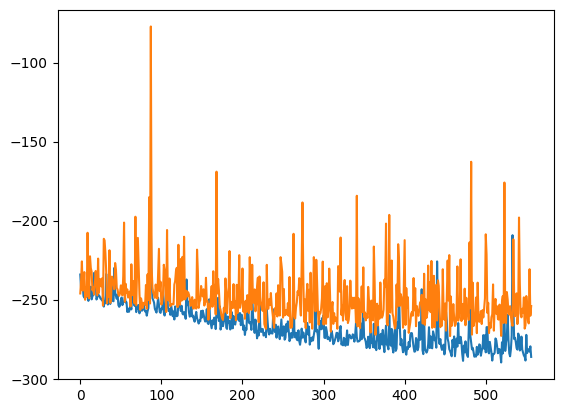

train_weighted_vae: enc
train: iter 0  trainloss -289.45105  validloss -268.41111±0.00000  bestvalidloss -268.41111  last_update 0
train: iter 1  trainloss -290.18411  validloss -269.41870±0.00000  bestvalidloss -269.41870  last_update 0
train: iter 2  trainloss -288.28653  validloss -261.95308±0.00000  bestvalidloss -269.41870  last_update 1
train: iter 3  trainloss -286.77981  validloss -276.71819±0.00000  bestvalidloss -276.71819  last_update 0
train: iter 4  trainloss -288.17516  validloss -269.05033±0.00000  bestvalidloss -276.71819  last_update 1
train: iter 5  trainloss -290.54426  validloss -259.28354±0.00000  bestvalidloss -276.71819  last_update 2
train: iter 6  trainloss -286.73161  validloss -263.73499±0.00000  bestvalidloss -276.71819  last_update 3
train: iter 7  trainloss -289.12577  validloss -265.41275±0.00000  bestvalidloss -276.71819  last_update 4
train: iter 8  trainloss -290.66268  validloss -252.74859±0.00000  bestvalidloss -276.71819  last_update 5
train: iter 9

train: iter 76  trainloss -288.47300  validloss -241.48684±0.00000  bestvalidloss -276.71819  last_update 73
train: iter 77  trainloss -290.55541  validloss -267.08813±0.00000  bestvalidloss -276.71819  last_update 74
train: iter 78  trainloss -289.07648  validloss -274.41171±0.00000  bestvalidloss -276.71819  last_update 75
train: iter 79  trainloss -289.19933  validloss -255.66300±0.00000  bestvalidloss -276.71819  last_update 76
train: iter 80  trainloss -290.34539  validloss -258.94640±0.00000  bestvalidloss -276.71819  last_update 77
train: iter 81  trainloss -289.62197  validloss -267.64417±0.00000  bestvalidloss -276.71819  last_update 78
train: iter 82  trainloss -290.17702  validloss -269.81578±0.00000  bestvalidloss -276.71819  last_update 79
train: iter 83  trainloss -285.00219  validloss -253.48459±0.00000  bestvalidloss -276.71819  last_update 80
train: iter 84  trainloss -283.22381  validloss -232.53403±0.00000  bestvalidloss -276.71819  last_update 81
train: iter 85  tra

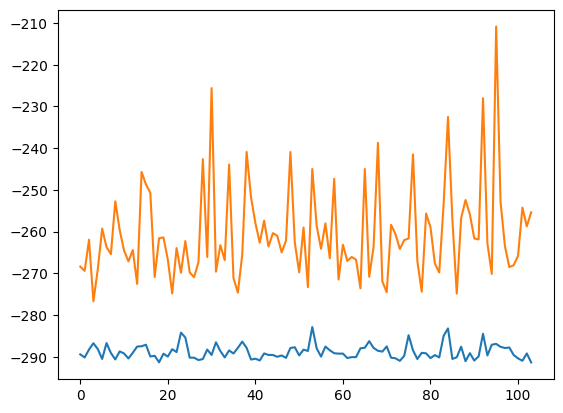

train_weighted_vae: dec
train: iter 0  trainloss -282.62869  validloss -273.77185±0.00000  bestvalidloss -273.77185  last_update 0
train: iter 1  trainloss -286.20308  validloss -253.98405±0.00000  bestvalidloss -273.77185  last_update 1
train: iter 2  trainloss -283.16166  validloss -268.11072±0.00000  bestvalidloss -273.77185  last_update 2
train: iter 3  trainloss -286.18929  validloss -268.39639±0.00000  bestvalidloss -273.77185  last_update 3
train: iter 4  trainloss -285.61388  validloss -259.87030±0.00000  bestvalidloss -273.77185  last_update 4
train: iter 5  trainloss -285.49626  validloss -261.05086±0.00000  bestvalidloss -273.77185  last_update 5
train: iter 6  trainloss -290.68502  validloss -257.53267±0.00000  bestvalidloss -273.77185  last_update 6
train: iter 7  trainloss -279.40012  validloss -248.41161±0.00000  bestvalidloss -273.77185  last_update 7
train: iter 8  trainloss -265.21102  validloss -257.63555±0.00000  bestvalidloss -273.77185  last_update 8
train: iter 9

train: iter 76  trainloss -290.20489  validloss -267.22861±0.00000  bestvalidloss -273.77185  last_update 76
train: iter 77  trainloss -292.90651  validloss -259.92159±0.00000  bestvalidloss -273.77185  last_update 77
train: iter 78  trainloss -288.41324  validloss -258.64692±0.00000  bestvalidloss -273.77185  last_update 78
train: iter 79  trainloss -290.76157  validloss -254.88104±0.00000  bestvalidloss -273.77185  last_update 79
train: iter 80  trainloss -277.06213  validloss -245.98000±0.00000  bestvalidloss -273.77185  last_update 80
train: iter 81  trainloss -279.31063  validloss -252.53946±0.00000  bestvalidloss -273.77185  last_update 81
train: iter 82  trainloss -286.89229  validloss -261.11656±0.00000  bestvalidloss -273.77185  last_update 82
train: iter 83  trainloss -286.68023  validloss -236.54963±0.00000  bestvalidloss -273.77185  last_update 83
train: iter 84  trainloss -288.57284  validloss -268.26953±0.00000  bestvalidloss -273.77185  last_update 84
train: iter 85  tra

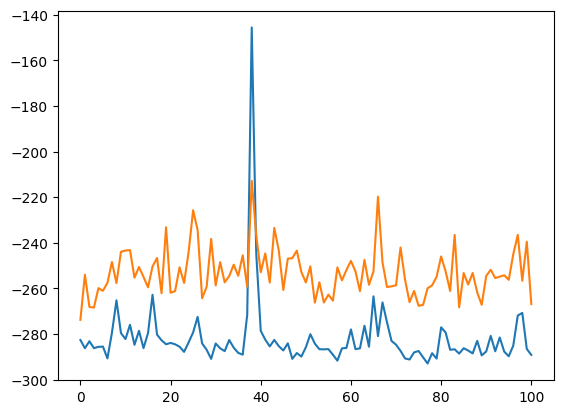

alpha 0.3 vae_lr 0.0005


In [17]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])


 0 4.76837158203125e-07
c = 0.1816481345560823

 1 2.0882937908172607
c = 0.2595622991662632

 2 2.0797815322875977
c = 0.22345235375341818

 3 2.1311705112457275
c = 0.2723719390846637

 4 2.0986292362213135
c = 0.08393842485309344

 5 2.187725067138672
c = 0.18640707691011152

 6 2.3693594932556152
c = 0.18538989085752725

 7 2.1478092670440674
c = 0.2888343485775251

 8 2.0436508655548096
c = 0.13352656897759982

 9 2.1302082538604736
c = 0.05422550034438941

 10 2.1428797245025635
c = 0.06484239937062307

 11 2.1151809692382812
c = 0.11212430131842514

 12 2.069981575012207
c = 0.10619157604828967

 13 2.1935982704162598
c = 0.28141547343045437

 14 2.034867525100708
c = 0.04494895898965532

 15 2.1764636039733887
c = 0.04795714313209284

 16 2.1393797397613525
c = 0.09653533648797118

 17 2.1526992321014404
c = 0.12033289390730735

 18 2.184096097946167
c = 0.0761672088100044

 19 1.973057508468628
c = 0.03659908027547439

 20 2.1178066730499268
c = 0.009422374433268599

 21 2.16


 74 2.112511157989502
c = 0.23242363760916676

 75 2.1306185722351074
c = 0.15948856030202505

 76 2.0931928157806396
c = 0.2483240423081437

 77 2.1177356243133545
c = 0.18603153133083958

 78 2.0591630935668945
c = 0.03368996508707354

 79 2.124243974685669
c = 0.2295923613762574

 80 2.0440969467163086
c = 0.13918058191925936

 81 2.113496780395508
c = 0.02643062855820334

 82 2.0718882083892822
c = 0.045181870243002555

 83 2.1632912158966064
c = 0.2534765790002846

 84 2.101614236831665
c = 0.263297085215516

 85 2.0661356449127197
c = 0.21198174869336295

 86 2.0349643230438232
c = 0.22047580544447534

 87 2.0425257682800293
c = 0.2451591836759596

 88 2.0575149059295654
c = 0.07472831410639325

 89 2.1673293113708496
c = 0.13503070186167274

 90 2.0607261657714844
c = 0.09101962087336185

 91 2.1095080375671387
c = 0.19509388222927307

 92 2.148439407348633
c = 0.21298721821536354

 93 2.0948803424835205
c = 0.15197620761044114

 94 2.227759838104248
c = 0.2548308088866989

 95

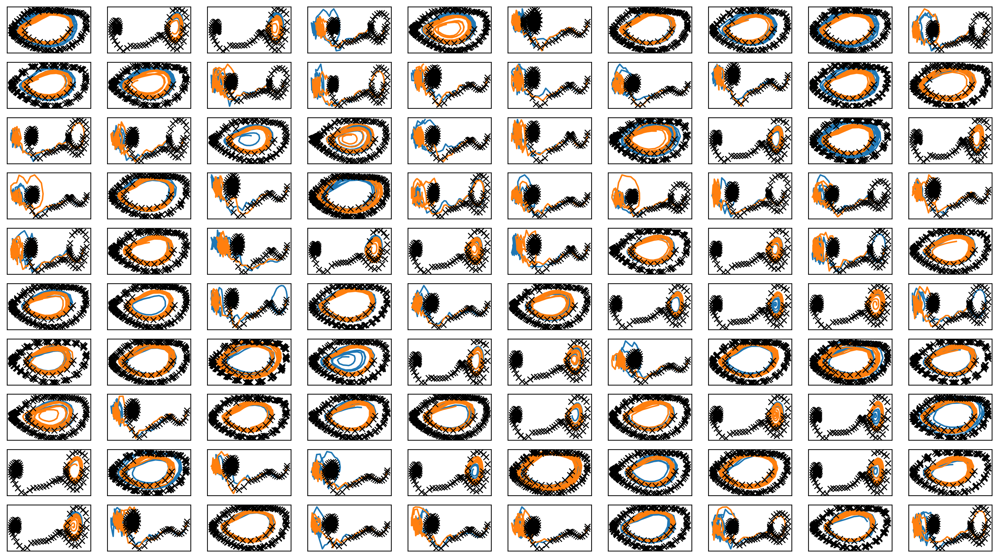

In [18]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0d = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_data_fixlen()
# simdata0e = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 
#     ax_list[-1].plot(simdata0d[i][:,0], simdata0d[i][:,1]) 
#     ax_list[-1].plot(simdata0e[i][:,0], simdata0e[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"iter1.png")
plt.savefig(figfilenamehead+"iter1.eps")
plt.savefig(figfilenamehead+"iter1.pdf")
print("実環境方策rollout vs Sim環境方策rollout")

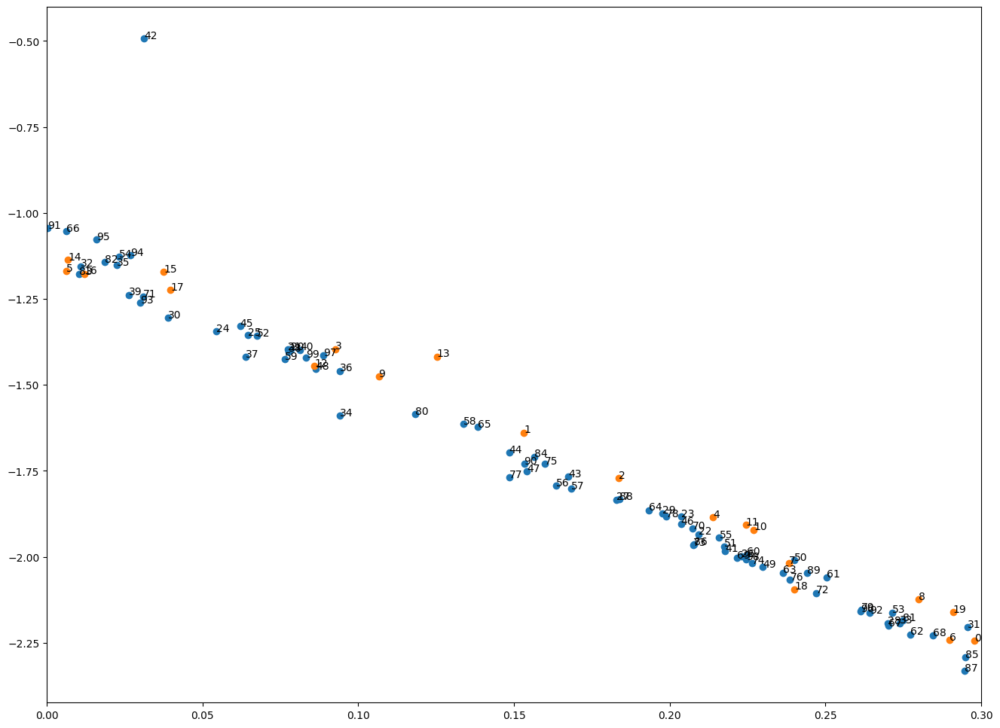

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [19]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter1.png")
plt.savefig(figfilenamehead+"damping_latent_iter1.eps")
plt.savefig(figfilenamehead+"damping_latent_iter1.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [20]:
print(datetime.datetime.now())

2023-04-12 14:28:08.042875


# Iter2

In [21]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()


 0
c = 0.010909793088989239
c = 0.1040007640104006
c = 0.2705342538523437
c = 0.1643647270697606
c = 0.0019545835308062863
c = 0.28852464379437
c = 0.13976590334112968
c = 0.1208234782212854
c = 0.1928364430542848
c = 0.09375876164156101
c = 0.25287192665272157
c = 0.11728194081464806
c = 0.009058767152265968
c = 0.13511237722482614
c = 0.0800353959507817
c = 0.07935248022688375
c = 0.19918273941625295
c = 0.17045154419995737
c = 0.1399251791899744
c = 0.25416138785542225

 1
c = 0.2730887536571675
c = 0.19452791776546743
c = 0.1728066589741784
c = 0.06609766136951402
c = 0.17550383292860466
c = 0.2302416175072141
c = 0.17815085832812996
c = 0.29404197492784767
c = 0.03810519530539092
c = 0.07508838690036548
c = 0.1521186148511639
c = 0.26473736223935107
c = 0.05900067648111718
c = 0.1699215497792744
c = 0.20828710228511585
c = 0.15490838635980306

 2
c = 0.031997041488214646
c = 0.1796908731765224
c = 0.1602416246364427
c = 0.15483462266859038
c = 0.2448653391665823
c = 0.15211521739

c = 0.15911320972470586

 26
c = 0.011400748842364626
c = 0.2157179054614682
c = 0.2562219837793526
c = 0.27613764939949076
c = 0.16148859388346185

 27
c = 0.028399372442379965
c = 0.18997493844005692
c = 0.19090907851510167
c = 0.2839171201016834
c = 0.2504628245557186
c = 0.034069247475046825
c = 0.15237764843252388
c = 0.05195178498966472
c = 0.25564418934442434
c = 0.25008952304974186
c = 0.24590333144929732

 28
c = 0.22903087474993636
c = 0.10511675950536128
c = 0.04640893401511009
c = 0.2999286177191814
c = 0.12431825472841984
c = 0.27879615510017364
c = 0.043356312275998156
c = 0.16770626458082444
c = 0.12216425222878555
c = 0.08669897929937682
c = 0.2173223009815564
c = 0.04016803715980253

 29
c = 0.15314808326852142
c = 0.06680140733551367
c = 0.2967165058050016
c = 0.24615146523954468
c = 0.09395488151759503
c = 0.0656016494948471
c = 0.0996381471623717
c = 0.07759695639773316
c = 0.13655912570411918
c = 0.2775595327863956
c = 0.10403896331930028
c = 0.14704097087911533

 

c = 0.2120526226612438
c = 0.10813347115106177
c = 0.15213300184386375
c = 0.1624577638822885
c = 0.06509386264371807
c = 0.1967265679207321

 56
c = 0.123159036902203
c = 0.10885632710193867
c = 0.24300172328123698
c = 0.2001579858321277
c = 0.20256398444077298
c = 0.15642357440684876
c = 0.2657848881482573
c = 0.14981491334591182
c = 0.23219536365490465
c = 0.2794591808017269
c = 0.282530636382588
c = 0.23441790584434313
c = 0.14855803092392458

 57
c = 0.2364380830067827
c = 0.1922800510797192
c = 0.07193166743395647
c = 0.25266638935033997
c = 0.0008710328730283434
c = 0.03360398517255222
c = 0.06236388937851581
c = 0.06015911195139981
c = 0.14426214219016412
c = 0.2078769888035203
c = 0.14307134400724675
c = 0.28867549336426523
c = 0.2359673580967594
c = 0.14957913596534678
c = 0.11962823899660197
c = 0.038014813891227614
c = 0.005951006138434178
c = 0.09170516139689301
c = 0.2158745553127264

 58
c = 0.0682894770477863
c = 0.11035894820865158
c = 0.20225441391412932
c = 0.0447134

c = 0.1310222675825332
c = 0.13617812874936816
c = 0.11494747452779652

 82
c = 0.23545827928403126
c = 0.06794317889965269
c = 0.11219702194290444
c = 0.021478265668554142
c = 0.06525232972648733
c = 0.24372199673183131
c = 0.23113970075863804
c = 0.19556404660830878
c = 0.23733102482230423
c = 0.2582845730732746
c = 0.17308550746087398
c = 0.20507503354812176
c = 0.17768075349853568
c = 0.1045793444175979
c = 0.28075764579516543
c = 0.1094815342890502

 83
c = 0.25674418519786774
c = 0.2683135153052237
c = 0.02862206208636557
c = 0.09217380944498256
c = 0.21825840287371176
c = 0.17400738034524782
c = 0.13294756535041766
c = 0.15481783854929154
c = 0.10298289338188879
c = 0.11749559877452215
c = 0.13171135832389672
c = 0.20776239762668455

 84
c = 0.17693003662364037
c = 0.15138851468819722
c = 0.137950259219878
c = 0.2835169752086979
c = 0.29101574378173034
c = 0.2367575306061098
c = 0.16928269018168232
c = 0.06804632570886432
c = 0.011644144100446684
c = 0.2229974675139841

 85
c = 

In [22]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


train: iter 0  trainloss 0.63169  validloss 1.10854±0.00000  bestvalidloss 1.10854  last_update 0
train: iter 1  trainloss 0.51133  validloss 0.47391±0.00000  bestvalidloss 0.47391  last_update 0
train: iter 2  trainloss 0.48698  validloss 0.42590±0.00000  bestvalidloss 0.42590  last_update 0
train: iter 3  trainloss 0.47840  validloss 0.42753±0.00000  bestvalidloss 0.42590  last_update 1
train: iter 4  trainloss 0.47244  validloss 0.40524±0.00000  bestvalidloss 0.40524  last_update 0
train: iter 5  trainloss 0.46998  validloss 0.40390±0.00000  bestvalidloss 0.40390  last_update 0
train: iter 6  trainloss 0.46629  validloss 0.40257±0.00000  bestvalidloss 0.40257  last_update 0
train: iter 7  trainloss 0.46110  validloss 0.40764±0.00000  bestvalidloss 0.40257  last_update 1
train: iter 8  trainloss 0.46035  validloss 0.40058±0.00000  bestvalidloss 0.40058  last_update 0
train: iter 9  trainloss 0.46316  validloss 0.39718±0.00000  bestvalidloss 0.39718  last_update 0
train: iter 10  trai

train: iter 84  trainloss 0.41181  validloss 0.36382±0.00000  bestvalidloss 0.36275  last_update 8
train: iter 85  trainloss 0.41110  validloss 0.35832±0.00000  bestvalidloss 0.35832  last_update 0
train: iter 86  trainloss 0.41307  validloss 0.36521±0.00000  bestvalidloss 0.35832  last_update 1
train: iter 87  trainloss 0.41196  validloss 0.36151±0.00000  bestvalidloss 0.35832  last_update 2
train: iter 88  trainloss 0.41368  validloss 0.36011±0.00000  bestvalidloss 0.35832  last_update 3
train: iter 89  trainloss 0.41159  validloss 0.36745±0.00000  bestvalidloss 0.35832  last_update 4
train: iter 90  trainloss 0.41453  validloss 0.38560±0.00000  bestvalidloss 0.35832  last_update 5
train: iter 91  trainloss 0.41027  validloss 0.36277±0.00000  bestvalidloss 0.35832  last_update 6
train: iter 92  trainloss 0.41205  validloss 0.36355±0.00000  bestvalidloss 0.35832  last_update 7
train: iter 93  trainloss 0.41001  validloss 0.35998±0.00000  bestvalidloss 0.35832  last_update 8
train: ite

train: iter 166  trainloss 0.40176  validloss 0.35639±0.00000  bestvalidloss 0.34974  last_update 25
train: iter 167  trainloss 0.40181  validloss 0.35183±0.00000  bestvalidloss 0.34974  last_update 26
train: iter 168  trainloss 0.39985  validloss 0.38773±0.00000  bestvalidloss 0.34974  last_update 27
train: iter 169  trainloss 0.39986  validloss 0.35243±0.00000  bestvalidloss 0.34974  last_update 28
train: iter 170  trainloss 0.40134  validloss 0.34933±0.00000  bestvalidloss 0.34933  last_update 0
train: iter 171  trainloss 0.40049  validloss 0.35618±0.00000  bestvalidloss 0.34933  last_update 1
train: iter 172  trainloss 0.40130  validloss 0.35427±0.00000  bestvalidloss 0.34933  last_update 2
train: iter 173  trainloss 0.40157  validloss 0.35824±0.00000  bestvalidloss 0.34933  last_update 3
train: iter 174  trainloss 0.39845  validloss 0.34869±0.00000  bestvalidloss 0.34869  last_update 0
train: iter 175  trainloss 0.39910  validloss 0.35221±0.00000  bestvalidloss 0.34869  last_updat

train: iter 249  trainloss 0.39124  validloss 0.34863±0.00000  bestvalidloss 0.34076  last_update 5
train: iter 250  trainloss 0.39024  validloss 0.33984±0.00000  bestvalidloss 0.33984  last_update 0
train: iter 251  trainloss 0.39067  validloss 0.34689±0.00000  bestvalidloss 0.33984  last_update 1
train: iter 252  trainloss 0.39221  validloss 0.34618±0.00000  bestvalidloss 0.33984  last_update 2
train: iter 253  trainloss 0.39188  validloss 0.34856±0.00000  bestvalidloss 0.33984  last_update 3
train: iter 254  trainloss 0.39181  validloss 0.34350±0.00000  bestvalidloss 0.33984  last_update 4
train: iter 255  trainloss 0.38937  validloss 0.33905±0.00000  bestvalidloss 0.33905  last_update 0
train: iter 256  trainloss 0.39164  validloss 0.34258±0.00000  bestvalidloss 0.33905  last_update 1
train: iter 257  trainloss 0.38958  validloss 0.34640±0.00000  bestvalidloss 0.33905  last_update 2
train: iter 258  trainloss 0.39101  validloss 0.34520±0.00000  bestvalidloss 0.33905  last_update 3


train: iter 331  trainloss 0.38707  validloss 0.33989±0.00000  bestvalidloss 0.33311  last_update 6
train: iter 332  trainloss 0.38498  validloss 0.33784±0.00000  bestvalidloss 0.33311  last_update 7
train: iter 333  trainloss 0.38499  validloss 0.33684±0.00000  bestvalidloss 0.33311  last_update 8
train: iter 334  trainloss 0.38537  validloss 0.33715±0.00000  bestvalidloss 0.33311  last_update 9
train: iter 335  trainloss 0.38366  validloss 0.33690±0.00000  bestvalidloss 0.33311  last_update 10
train: iter 336  trainloss 0.38400  validloss 0.33770±0.00000  bestvalidloss 0.33311  last_update 11
train: iter 337  trainloss 0.38236  validloss 0.33803±0.00000  bestvalidloss 0.33311  last_update 12
train: iter 338  trainloss 0.38475  validloss 0.33922±0.00000  bestvalidloss 0.33311  last_update 13
train: iter 339  trainloss 0.38462  validloss 0.33430±0.00000  bestvalidloss 0.33311  last_update 14
train: iter 340  trainloss 0.38769  validloss 0.33614±0.00000  bestvalidloss 0.33311  last_upda

train: iter 414  trainloss 0.37914  validloss 0.32904±0.00000  bestvalidloss 0.32904  last_update 0
train: iter 415  trainloss 0.37781  validloss 0.32993±0.00000  bestvalidloss 0.32904  last_update 1
train: iter 416  trainloss 0.37959  validloss 0.33819±0.00000  bestvalidloss 0.32904  last_update 2
train: iter 417  trainloss 0.37928  validloss 0.34236±0.00000  bestvalidloss 0.32904  last_update 3
train: iter 418  trainloss 0.38146  validloss 0.33735±0.00000  bestvalidloss 0.32904  last_update 4
train: iter 419  trainloss 0.37892  validloss 0.33127±0.00000  bestvalidloss 0.32904  last_update 5
train: iter 420  trainloss 0.37694  validloss 0.33055±0.00000  bestvalidloss 0.32904  last_update 6
train: iter 421  trainloss 0.37943  validloss 0.33712±0.00000  bestvalidloss 0.32904  last_update 7
train: iter 422  trainloss 0.37791  validloss 0.32947±0.00000  bestvalidloss 0.32904  last_update 8
train: iter 423  trainloss 0.37737  validloss 0.33049±0.00000  bestvalidloss 0.32904  last_update 9


train: iter 496  trainloss 0.37524  validloss 0.32628±0.00000  bestvalidloss 0.32611  last_update 19
train: iter 497  trainloss 0.37064  validloss 0.32987±0.00000  bestvalidloss 0.32611  last_update 20
train: iter 498  trainloss 0.37053  validloss 0.33221±0.00000  bestvalidloss 0.32611  last_update 21
train: iter 499  trainloss 0.37247  validloss 0.33698±0.00000  bestvalidloss 0.32611  last_update 22
train: iter 500  trainloss 0.37207  validloss 0.33066±0.00000  bestvalidloss 0.32611  last_update 23
train: iter 501  trainloss 0.37088  validloss 0.33218±0.00000  bestvalidloss 0.32611  last_update 24
train: iter 502  trainloss 0.37462  validloss 0.33123±0.00000  bestvalidloss 0.32611  last_update 25
train: iter 503  trainloss 0.37404  validloss 0.32793±0.00000  bestvalidloss 0.32611  last_update 26
train: iter 504  trainloss 0.37073  validloss 0.32949±0.00000  bestvalidloss 0.32611  last_update 27
train: iter 505  trainloss 0.37095  validloss 0.33161±0.00000  bestvalidloss 0.32611  last_

train: iter 579  trainloss 0.36738  validloss 0.32675±0.00000  bestvalidloss 0.32040  last_update 25
train: iter 580  trainloss 0.36890  validloss 0.32042±0.00000  bestvalidloss 0.32040  last_update 26
train: iter 581  trainloss 0.36780  validloss 0.32589±0.00000  bestvalidloss 0.32040  last_update 27
train: iter 582  trainloss 0.36825  validloss 0.32097±0.00000  bestvalidloss 0.32040  last_update 28
train: iter 583  trainloss 0.36622  validloss 0.32565±0.00000  bestvalidloss 0.32040  last_update 29
train: iter 584  trainloss 0.36572  validloss 0.32770±0.00000  bestvalidloss 0.32040  last_update 30
train: iter 585  trainloss 0.36945  validloss 0.32652±0.00000  bestvalidloss 0.32040  last_update 31
train: iter 586  trainloss 0.36700  validloss 0.32248±0.00000  bestvalidloss 0.32040  last_update 32
train: iter 587  trainloss 0.36668  validloss 0.32429±0.00000  bestvalidloss 0.32040  last_update 33
train: iter 588  trainloss 0.36871  validloss 0.32200±0.00000  bestvalidloss 0.32040  last_

train: iter 661  trainloss 0.36355  validloss 0.33117±0.00000  bestvalidloss 0.31946  last_update 39
train: iter 662  trainloss 0.36343  validloss 0.31873±0.00000  bestvalidloss 0.31873  last_update 0
train: iter 663  trainloss 0.36119  validloss 0.31978±0.00000  bestvalidloss 0.31873  last_update 1
train: iter 664  trainloss 0.36598  validloss 0.32719±0.00000  bestvalidloss 0.31873  last_update 2
train: iter 665  trainloss 0.36319  validloss 0.32222±0.00000  bestvalidloss 0.31873  last_update 3
train: iter 666  trainloss 0.36028  validloss 0.31976±0.00000  bestvalidloss 0.31873  last_update 4
train: iter 667  trainloss 0.36263  validloss 0.32820±0.00000  bestvalidloss 0.31873  last_update 5
train: iter 668  trainloss 0.36554  validloss 0.32093±0.00000  bestvalidloss 0.31873  last_update 6
train: iter 669  trainloss 0.36269  validloss 0.32046±0.00000  bestvalidloss 0.31873  last_update 7
train: iter 670  trainloss 0.36131  validloss 0.31922±0.00000  bestvalidloss 0.31873  last_update 8

train: iter 744  trainloss 0.35632  validloss 0.31646±0.00000  bestvalidloss 0.31515  last_update 17
train: iter 745  trainloss 0.35772  validloss 0.31631±0.00000  bestvalidloss 0.31515  last_update 18
train: iter 746  trainloss 0.35728  validloss 0.31847±0.00000  bestvalidloss 0.31515  last_update 19
train: iter 747  trainloss 0.35716  validloss 0.32236±0.00000  bestvalidloss 0.31515  last_update 20
train: iter 748  trainloss 0.35725  validloss 0.33124±0.00000  bestvalidloss 0.31515  last_update 21
train: iter 749  trainloss 0.35795  validloss 0.32310±0.00000  bestvalidloss 0.31515  last_update 22
train: iter 750  trainloss 0.35837  validloss 0.31590±0.00000  bestvalidloss 0.31515  last_update 23
train: iter 751  trainloss 0.35804  validloss 0.31750±0.00000  bestvalidloss 0.31515  last_update 24
train: iter 752  trainloss 0.35734  validloss 0.32038±0.00000  bestvalidloss 0.31515  last_update 25
train: iter 753  trainloss 0.35692  validloss 0.31774±0.00000  bestvalidloss 0.31515  last_

train: iter 826  trainloss 0.35255  validloss 0.31834±0.00000  bestvalidloss 0.31101  last_update 2
train: iter 827  trainloss 0.35273  validloss 0.31970±0.00000  bestvalidloss 0.31101  last_update 3
train: iter 828  trainloss 0.35403  validloss 0.31693±0.00000  bestvalidloss 0.31101  last_update 4
train: iter 829  trainloss 0.35439  validloss 0.31461±0.00000  bestvalidloss 0.31101  last_update 5
train: iter 830  trainloss 0.35472  validloss 0.31387±0.00000  bestvalidloss 0.31101  last_update 6
train: iter 831  trainloss 0.35156  validloss 0.31351±0.00000  bestvalidloss 0.31101  last_update 7
train: iter 832  trainloss 0.35291  validloss 0.31177±0.00000  bestvalidloss 0.31101  last_update 8
train: iter 833  trainloss 0.35413  validloss 0.31907±0.00000  bestvalidloss 0.31101  last_update 9
train: iter 834  trainloss 0.35141  validloss 0.31432±0.00000  bestvalidloss 0.31101  last_update 10
train: iter 835  trainloss 0.35502  validloss 0.31637±0.00000  bestvalidloss 0.31101  last_update 1

train: iter 908  trainloss 0.35123  validloss 0.31782±0.00000  bestvalidloss 0.30858  last_update 3
train: iter 909  trainloss 0.34690  validloss 0.31343±0.00000  bestvalidloss 0.30858  last_update 4
train: iter 910  trainloss 0.34741  validloss 0.31306±0.00000  bestvalidloss 0.30858  last_update 5
train: iter 911  trainloss 0.34662  validloss 0.31472±0.00000  bestvalidloss 0.30858  last_update 6
train: iter 912  trainloss 0.35020  validloss 0.31122±0.00000  bestvalidloss 0.30858  last_update 7
train: iter 913  trainloss 0.34670  validloss 0.32412±0.00000  bestvalidloss 0.30858  last_update 8
train: iter 914  trainloss 0.34841  validloss 0.31063±0.00000  bestvalidloss 0.30858  last_update 9
train: iter 915  trainloss 0.34707  validloss 0.30979±0.00000  bestvalidloss 0.30858  last_update 10
train: iter 916  trainloss 0.34735  validloss 0.31174±0.00000  bestvalidloss 0.30858  last_update 11
train: iter 917  trainloss 0.34636  validloss 0.30874±0.00000  bestvalidloss 0.30858  last_update 

train: iter 991  trainloss 0.34472  validloss 0.30539±0.00000  bestvalidloss 0.30469  last_update 4
train: iter 992  trainloss 0.34056  validloss 0.30577±0.00000  bestvalidloss 0.30469  last_update 5
train: iter 993  trainloss 0.34009  validloss 0.31255±0.00000  bestvalidloss 0.30469  last_update 6
train: iter 994  trainloss 0.34330  validloss 0.30659±0.00000  bestvalidloss 0.30469  last_update 7
train: iter 995  trainloss 0.34503  validloss 0.30601±0.00000  bestvalidloss 0.30469  last_update 8
train: iter 996  trainloss 0.34145  validloss 0.30934±0.00000  bestvalidloss 0.30469  last_update 9
train: iter 997  trainloss 0.34281  validloss 0.31001±0.00000  bestvalidloss 0.30469  last_update 10
train: iter 998  trainloss 0.34719  validloss 0.31048±0.00000  bestvalidloss 0.30469  last_update 11
train: iter 999  trainloss 0.34099  validloss 0.30562±0.00000  bestvalidloss 0.30469  last_update 12
train: iter 1000  trainloss 0.34013  validloss 0.31156±0.00000  bestvalidloss 0.30469  last_updat

train: iter 1072  trainloss 0.33535  validloss 0.30965±0.00000  bestvalidloss 0.30367  last_update 30
train: iter 1073  trainloss 0.33588  validloss 0.31101±0.00000  bestvalidloss 0.30367  last_update 31
train: iter 1074  trainloss 0.33627  validloss 0.30824±0.00000  bestvalidloss 0.30367  last_update 32
train: iter 1075  trainloss 0.33701  validloss 0.30534±0.00000  bestvalidloss 0.30367  last_update 33
train: iter 1076  trainloss 0.33545  validloss 0.30620±0.00000  bestvalidloss 0.30367  last_update 34
train: iter 1077  trainloss 0.33662  validloss 0.30447±0.00000  bestvalidloss 0.30367  last_update 35
train: iter 1078  trainloss 0.33654  validloss 0.30272±0.00000  bestvalidloss 0.30272  last_update 0
train: iter 1079  trainloss 0.33791  validloss 0.30315±0.00000  bestvalidloss 0.30272  last_update 1
train: iter 1080  trainloss 0.33541  validloss 0.30406±0.00000  bestvalidloss 0.30272  last_update 2
train: iter 1081  trainloss 0.33413  validloss 0.30676±0.00000  bestvalidloss 0.30272

train: iter 1153  trainloss 0.32960  validloss 0.30639±0.00000  bestvalidloss 0.30085  last_update 24
train: iter 1154  trainloss 0.32844  validloss 0.30184±0.00000  bestvalidloss 0.30085  last_update 25
train: iter 1155  trainloss 0.33099  validloss 0.30624±0.00000  bestvalidloss 0.30085  last_update 26
train: iter 1156  trainloss 0.32940  validloss 0.30621±0.00000  bestvalidloss 0.30085  last_update 27
train: iter 1157  trainloss 0.33010  validloss 0.30470±0.00000  bestvalidloss 0.30085  last_update 28
train: iter 1158  trainloss 0.33048  validloss 0.30487±0.00000  bestvalidloss 0.30085  last_update 29
train: iter 1159  trainloss 0.32867  validloss 0.30155±0.00000  bestvalidloss 0.30085  last_update 30
train: iter 1160  trainloss 0.32882  validloss 0.30519±0.00000  bestvalidloss 0.30085  last_update 31
train: iter 1161  trainloss 0.32771  validloss 0.30839±0.00000  bestvalidloss 0.30085  last_update 32
train: iter 1162  trainloss 0.32857  validloss 0.30360±0.00000  bestvalidloss 0.30

train: iter 1236  trainloss 0.32311  validloss 0.30146±0.00000  bestvalidloss 0.29941  last_update 2
train: iter 1237  trainloss 0.32139  validloss 0.30894±0.00000  bestvalidloss 0.29941  last_update 3
train: iter 1238  trainloss 0.32452  validloss 0.30107±0.00000  bestvalidloss 0.29941  last_update 4
train: iter 1239  trainloss 0.32242  validloss 0.30254±0.00000  bestvalidloss 0.29941  last_update 5
train: iter 1240  trainloss 0.32042  validloss 0.30513±0.00000  bestvalidloss 0.29941  last_update 6
train: iter 1241  trainloss 0.32223  validloss 0.30129±0.00000  bestvalidloss 0.29941  last_update 7
train: iter 1242  trainloss 0.32325  validloss 0.30063±0.00000  bestvalidloss 0.29941  last_update 8
train: iter 1243  trainloss 0.32167  validloss 0.29828±0.00000  bestvalidloss 0.29828  last_update 0
train: iter 1244  trainloss 0.31983  validloss 0.29892±0.00000  bestvalidloss 0.29828  last_update 1
train: iter 1245  trainloss 0.32343  validloss 0.30131±0.00000  bestvalidloss 0.29828  last

train: iter 1317  trainloss 0.31649  validloss 0.30761±0.00000  bestvalidloss 0.29591  last_update 47
train: iter 1318  trainloss 0.31726  validloss 0.30309±0.00000  bestvalidloss 0.29591  last_update 48
train: iter 1319  trainloss 0.31822  validloss 0.30637±0.00000  bestvalidloss 0.29591  last_update 49
train: iter 1320  trainloss 0.31735  validloss 0.30250±0.00000  bestvalidloss 0.29591  last_update 50
train: iter 1321  trainloss 0.31625  validloss 0.29823±0.00000  bestvalidloss 0.29591  last_update 51
train: iter 1322  trainloss 0.31572  validloss 0.30207±0.00000  bestvalidloss 0.29591  last_update 52
train: iter 1323  trainloss 0.31461  validloss 0.30062±0.00000  bestvalidloss 0.29591  last_update 53
train: iter 1324  trainloss 0.31731  validloss 0.29958±0.00000  bestvalidloss 0.29591  last_update 54
train: iter 1325  trainloss 0.31447  validloss 0.29635±0.00000  bestvalidloss 0.29591  last_update 55
train: iter 1326  trainloss 0.31423  validloss 0.29699±0.00000  bestvalidloss 0.29

train: iter 1398  trainloss 0.31306  validloss 0.29666±0.00000  bestvalidloss 0.29482  last_update 8
train: iter 1399  trainloss 0.31048  validloss 0.29773±0.00000  bestvalidloss 0.29482  last_update 9
train: iter 1400  trainloss 0.31144  validloss 0.29631±0.00000  bestvalidloss 0.29482  last_update 10
train: iter 1401  trainloss 0.31049  validloss 0.30765±0.00000  bestvalidloss 0.29482  last_update 11
train: iter 1402  trainloss 0.31408  validloss 0.30085±0.00000  bestvalidloss 0.29482  last_update 12
train: iter 1403  trainloss 0.31315  validloss 0.31326±0.00000  bestvalidloss 0.29482  last_update 13
train: iter 1404  trainloss 0.30983  validloss 0.29958±0.00000  bestvalidloss 0.29482  last_update 14
train: iter 1405  trainloss 0.30933  validloss 0.29647±0.00000  bestvalidloss 0.29482  last_update 15
train: iter 1406  trainloss 0.30889  validloss 0.29806±0.00000  bestvalidloss 0.29482  last_update 16
train: iter 1407  trainloss 0.31014  validloss 0.29468±0.00000  bestvalidloss 0.2946

train: iter 1479  trainloss 0.30617  validloss 0.29659±0.00000  bestvalidloss 0.29297  last_update 10
train: iter 1480  trainloss 0.30750  validloss 0.29319±0.00000  bestvalidloss 0.29297  last_update 11
train: iter 1481  trainloss 0.30665  validloss 0.29464±0.00000  bestvalidloss 0.29297  last_update 12
train: iter 1482  trainloss 0.30755  validloss 0.29740±0.00000  bestvalidloss 0.29297  last_update 13
train: iter 1483  trainloss 0.30692  validloss 0.29829±0.00000  bestvalidloss 0.29297  last_update 14
train: iter 1484  trainloss 0.30511  validloss 0.29599±0.00000  bestvalidloss 0.29297  last_update 15
train: iter 1485  trainloss 0.30660  validloss 0.29252±0.00000  bestvalidloss 0.29252  last_update 0
train: iter 1486  trainloss 0.30724  validloss 0.29174±0.00000  bestvalidloss 0.29174  last_update 0
train: iter 1487  trainloss 0.30714  validloss 0.29871±0.00000  bestvalidloss 0.29174  last_update 1
train: iter 1488  trainloss 0.30672  validloss 0.29212±0.00000  bestvalidloss 0.29174

train: iter 1560  trainloss 0.30333  validloss 0.30658±0.00000  bestvalidloss 0.29087  last_update 32
train: iter 1561  trainloss 0.30401  validloss 0.29906±0.00000  bestvalidloss 0.29087  last_update 33
train: iter 1562  trainloss 0.30547  validloss 0.29519±0.00000  bestvalidloss 0.29087  last_update 34
train: iter 1563  trainloss 0.30376  validloss 0.29286±0.00000  bestvalidloss 0.29087  last_update 35
train: iter 1564  trainloss 0.30259  validloss 0.29639±0.00000  bestvalidloss 0.29087  last_update 36
train: iter 1565  trainloss 0.30122  validloss 0.29311±0.00000  bestvalidloss 0.29087  last_update 37
train: iter 1566  trainloss 0.30265  validloss 0.29063±0.00000  bestvalidloss 0.29063  last_update 0
train: iter 1567  trainloss 0.30315  validloss 0.29351±0.00000  bestvalidloss 0.29063  last_update 1
train: iter 1568  trainloss 0.30253  validloss 0.29151±0.00000  bestvalidloss 0.29063  last_update 2
train: iter 1569  trainloss 0.30270  validloss 0.29495±0.00000  bestvalidloss 0.29063

train: iter 1641  trainloss 0.30081  validloss 0.29554±0.00000  bestvalidloss 0.28879  last_update 29
train: iter 1642  trainloss 0.30257  validloss 0.31160±0.00000  bestvalidloss 0.28879  last_update 30
train: iter 1643  trainloss 0.30177  validloss 0.29459±0.00000  bestvalidloss 0.28879  last_update 31
train: iter 1644  trainloss 0.29910  validloss 0.29055±0.00000  bestvalidloss 0.28879  last_update 32
train: iter 1645  trainloss 0.30212  validloss 0.29599±0.00000  bestvalidloss 0.28879  last_update 33
train: iter 1646  trainloss 0.30285  validloss 0.29540±0.00000  bestvalidloss 0.28879  last_update 34
train: iter 1647  trainloss 0.29966  validloss 0.29479±0.00000  bestvalidloss 0.28879  last_update 35
train: iter 1648  trainloss 0.30054  validloss 0.29393±0.00000  bestvalidloss 0.28879  last_update 36
train: iter 1649  trainloss 0.29987  validloss 0.28975±0.00000  bestvalidloss 0.28879  last_update 37
train: iter 1650  trainloss 0.30217  validloss 0.29282±0.00000  bestvalidloss 0.28

train: iter 1722  trainloss 0.29920  validloss 0.29069±0.00000  bestvalidloss 0.28838  last_update 2
train: iter 1723  trainloss 0.29882  validloss 0.29719±0.00000  bestvalidloss 0.28838  last_update 3
train: iter 1724  trainloss 0.29992  validloss 0.29085±0.00000  bestvalidloss 0.28838  last_update 4
train: iter 1725  trainloss 0.29712  validloss 0.29396±0.00000  bestvalidloss 0.28838  last_update 5
train: iter 1726  trainloss 0.29830  validloss 0.28909±0.00000  bestvalidloss 0.28838  last_update 6
train: iter 1727  trainloss 0.29694  validloss 0.28995±0.00000  bestvalidloss 0.28838  last_update 7
train: iter 1728  trainloss 0.29727  validloss 0.28817±0.00000  bestvalidloss 0.28817  last_update 0
train: iter 1729  trainloss 0.30084  validloss 0.28932±0.00000  bestvalidloss 0.28817  last_update 1
train: iter 1730  trainloss 0.29659  validloss 0.29663±0.00000  bestvalidloss 0.28817  last_update 2
train: iter 1731  trainloss 0.29674  validloss 0.28944±0.00000  bestvalidloss 0.28817  last

train: iter 1803  trainloss 0.29616  validloss 0.29031±0.00000  bestvalidloss 0.28558  last_update 14
train: iter 1804  trainloss 0.29570  validloss 0.29799±0.00000  bestvalidloss 0.28558  last_update 15
train: iter 1805  trainloss 0.29510  validloss 0.29526±0.00000  bestvalidloss 0.28558  last_update 16
train: iter 1806  trainloss 0.29699  validloss 0.28763±0.00000  bestvalidloss 0.28558  last_update 17
train: iter 1807  trainloss 0.29492  validloss 0.29219±0.00000  bestvalidloss 0.28558  last_update 18
train: iter 1808  trainloss 0.29486  validloss 0.28965±0.00000  bestvalidloss 0.28558  last_update 19
train: iter 1809  trainloss 0.29759  validloss 0.28951±0.00000  bestvalidloss 0.28558  last_update 20
train: iter 1810  trainloss 0.29539  validloss 0.29209±0.00000  bestvalidloss 0.28558  last_update 21
train: iter 1811  trainloss 0.29525  validloss 0.28638±0.00000  bestvalidloss 0.28558  last_update 22
train: iter 1812  trainloss 0.29579  validloss 0.29372±0.00000  bestvalidloss 0.28

train: iter 1884  trainloss 0.29334  validloss 0.29090±0.00000  bestvalidloss 0.28499  last_update 1
train: iter 1885  trainloss 0.29505  validloss 0.29227±0.00000  bestvalidloss 0.28499  last_update 2
train: iter 1886  trainloss 0.29526  validloss 0.28842±0.00000  bestvalidloss 0.28499  last_update 3
train: iter 1887  trainloss 0.29217  validloss 0.28660±0.00000  bestvalidloss 0.28499  last_update 4
train: iter 1888  trainloss 0.29293  validloss 0.29055±0.00000  bestvalidloss 0.28499  last_update 5
train: iter 1889  trainloss 0.29405  validloss 0.28866±0.00000  bestvalidloss 0.28499  last_update 6
train: iter 1890  trainloss 0.29410  validloss 0.28888±0.00000  bestvalidloss 0.28499  last_update 7
train: iter 1891  trainloss 0.29309  validloss 0.29148±0.00000  bestvalidloss 0.28499  last_update 8
train: iter 1892  trainloss 0.29352  validloss 0.28839±0.00000  bestvalidloss 0.28499  last_update 9
train: iter 1893  trainloss 0.29474  validloss 0.28725±0.00000  bestvalidloss 0.28499  last

train: iter 1965  trainloss 0.28989  validloss 0.28633±0.00000  bestvalidloss 0.28330  last_update 14
train: iter 1966  trainloss 0.29268  validloss 0.29306±0.00000  bestvalidloss 0.28330  last_update 15
train: iter 1967  trainloss 0.29150  validloss 0.29933±0.00000  bestvalidloss 0.28330  last_update 16
train: iter 1968  trainloss 0.28990  validloss 0.28926±0.00000  bestvalidloss 0.28330  last_update 17
train: iter 1969  trainloss 0.29159  validloss 0.28633±0.00000  bestvalidloss 0.28330  last_update 18
train: iter 1970  trainloss 0.29200  validloss 0.28909±0.00000  bestvalidloss 0.28330  last_update 19
train: iter 1971  trainloss 0.29112  validloss 0.28595±0.00000  bestvalidloss 0.28330  last_update 20
train: iter 1972  trainloss 0.29199  validloss 0.29063±0.00000  bestvalidloss 0.28330  last_update 21
train: iter 1973  trainloss 0.29114  validloss 0.29087±0.00000  bestvalidloss 0.28330  last_update 22
train: iter 1974  trainloss 0.29066  validloss 0.28823±0.00000  bestvalidloss 0.28

train: iter 2046  trainloss 0.28906  validloss 0.28724±0.00000  bestvalidloss 0.28330  last_update 95
train: iter 2047  trainloss 0.28865  validloss 0.28496±0.00000  bestvalidloss 0.28330  last_update 96
train: iter 2048  trainloss 0.29004  validloss 0.28788±0.00000  bestvalidloss 0.28330  last_update 97
train: iter 2049  trainloss 0.28909  validloss 0.28646±0.00000  bestvalidloss 0.28330  last_update 98
train: iter 2050  trainloss 0.29006  validloss 0.28880±0.00000  bestvalidloss 0.28330  last_update 99
train: iter 2051  trainloss 0.29107  validloss 0.29323±0.00000  bestvalidloss 0.28330  last_update 100
train: fin


In [23]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -375.20460695266723
valid_loss:  -361.8382872772217
train_loss:  -288.0295993328094
valid_loss:  -263.2232834243774


1e-08 1000.0


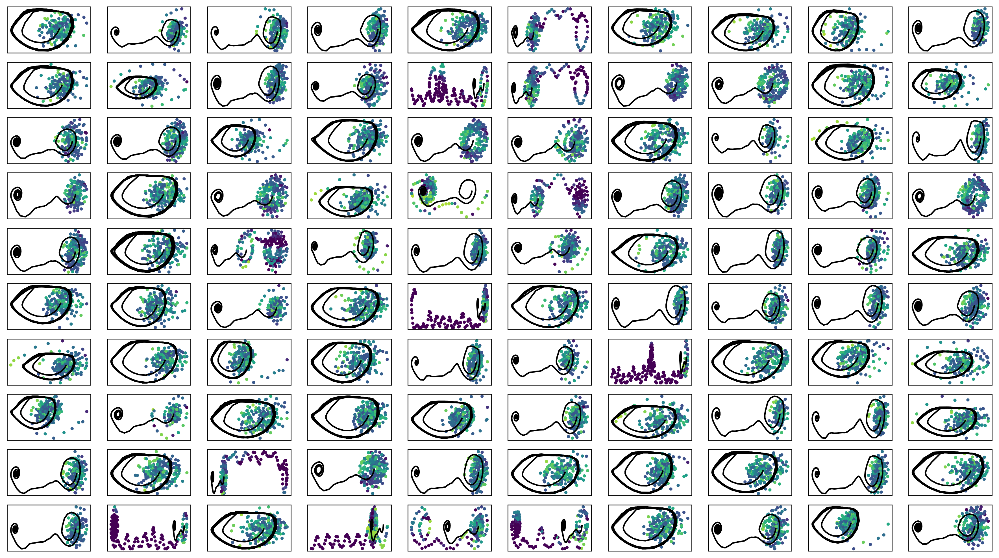

In [24]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter2.png")

In [25]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [26]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


train_weighted_vae: enc_dec
train: iter 0  trainloss -269.81365  validloss -265.46112±0.00000  bestvalidloss -265.46112  last_update 0
train: iter 1  trainloss -282.40273  validloss -237.05751±0.00000  bestvalidloss -265.46112  last_update 1
train: iter 2  trainloss -285.71716  validloss -262.69760±0.00000  bestvalidloss -265.46112  last_update 2
train: iter 3  trainloss -285.80409  validloss -271.68915±0.00000  bestvalidloss -271.68915  last_update 0
train: iter 4  trainloss -278.48765  validloss -287.91590±0.00000  bestvalidloss -287.91590  last_update 0
train: iter 5  trainloss -281.42443  validloss -271.84218±0.00000  bestvalidloss -287.91590  last_update 1
train: iter 6  trainloss -269.33434  validloss -277.31584±0.00000  bestvalidloss -287.91590  last_update 2
train: iter 7  trainloss -275.14994  validloss -234.70331±0.00000  bestvalidloss -287.91590  last_update 3
train: iter 8  trainloss -285.89813  validloss -258.85939±0.00000  bestvalidloss -287.91590  last_update 4
train: it

train: iter 77  trainloss -278.85694  validloss -263.34151±0.00000  bestvalidloss -290.20299  last_update 14
train: iter 78  trainloss -280.88544  validloss -247.49303±0.00000  bestvalidloss -290.20299  last_update 15
train: iter 79  trainloss -284.28922  validloss -289.17867±0.00000  bestvalidloss -290.20299  last_update 16
train: iter 80  trainloss -277.71555  validloss -239.44053±0.00000  bestvalidloss -290.20299  last_update 17
train: iter 81  trainloss -279.08907  validloss -261.28257±0.00000  bestvalidloss -290.20299  last_update 18
train: iter 82  trainloss -285.59326  validloss -284.10744±0.00000  bestvalidloss -290.20299  last_update 19
train: iter 83  trainloss -282.65605  validloss -275.49469±0.00000  bestvalidloss -290.20299  last_update 20
train: iter 84  trainloss -282.50638  validloss -279.48090±0.00000  bestvalidloss -290.20299  last_update 21
train: iter 85  trainloss -280.21089  validloss -257.12948±0.00000  bestvalidloss -290.20299  last_update 22
train: iter 86  tra

train: iter 153  trainloss -286.11928  validloss -277.09107±0.00000  bestvalidloss -292.10367  last_update 7
train: iter 154  trainloss -288.76568  validloss -278.59113±0.00000  bestvalidloss -292.10367  last_update 8
train: iter 155  trainloss -286.88977  validloss -248.76236±0.00000  bestvalidloss -292.10367  last_update 9
train: iter 156  trainloss -285.33206  validloss -289.95174±0.00000  bestvalidloss -292.10367  last_update 10
train: iter 157  trainloss -282.26148  validloss -270.58784±0.00000  bestvalidloss -292.10367  last_update 11
train: iter 158  trainloss -283.25034  validloss -224.40326±0.00000  bestvalidloss -292.10367  last_update 12
train: iter 159  trainloss -283.92537  validloss -280.02786±0.00000  bestvalidloss -292.10367  last_update 13
train: iter 160  trainloss -285.82258  validloss -288.58925±0.00000  bestvalidloss -292.10367  last_update 14
train: iter 161  trainloss -286.19135  validloss -285.27830±0.00000  bestvalidloss -292.10367  last_update 15
train: iter 1

train: iter 229  trainloss -291.37730  validloss -278.79941±0.00000  bestvalidloss -292.10367  last_update 83
train: iter 230  trainloss -281.99039  validloss -278.81238±0.00000  bestvalidloss -292.10367  last_update 84
train: iter 231  trainloss -289.42794  validloss -282.32505±0.00000  bestvalidloss -292.10367  last_update 85
train: iter 232  trainloss -294.52359  validloss -280.23058±0.00000  bestvalidloss -292.10367  last_update 86
train: iter 233  trainloss -291.53477  validloss -288.51363±0.00000  bestvalidloss -292.10367  last_update 87
train: iter 234  trainloss -290.03662  validloss -269.80944±0.00000  bestvalidloss -292.10367  last_update 88
train: iter 235  trainloss -264.69888  validloss -277.43794±0.00000  bestvalidloss -292.10367  last_update 89
train: iter 236  trainloss -283.81006  validloss -261.53165±0.00000  bestvalidloss -292.10367  last_update 90
train: iter 237  trainloss -295.61787  validloss -282.16519±0.00000  bestvalidloss -292.10367  last_update 91
train: ite

train: iter 304  trainloss -280.48827  validloss -247.01997±0.00000  bestvalidloss -307.56371  last_update 4
train: iter 305  trainloss -279.82466  validloss -252.59906±0.00000  bestvalidloss -307.56371  last_update 5
train: iter 306  trainloss -284.06952  validloss -270.77272±0.00000  bestvalidloss -307.56371  last_update 6
train: iter 307  trainloss -284.30098  validloss -268.98120±0.00000  bestvalidloss -307.56371  last_update 7
train: iter 308  trainloss -286.75208  validloss -271.59743±0.00000  bestvalidloss -307.56371  last_update 8
train: iter 309  trainloss -289.37408  validloss -272.68583±0.00000  bestvalidloss -307.56371  last_update 9
train: iter 310  trainloss -287.97321  validloss -283.60693±0.00000  bestvalidloss -307.56371  last_update 10
train: iter 311  trainloss -291.81937  validloss -275.41258±0.00000  bestvalidloss -307.56371  last_update 11
train: iter 312  trainloss -292.02369  validloss -277.37200±0.00000  bestvalidloss -307.56371  last_update 12
train: iter 313 

train: iter 380  trainloss -294.63760  validloss -259.83175±0.00000  bestvalidloss -307.56371  last_update 80
train: iter 381  trainloss -293.56443  validloss -290.49141±0.00000  bestvalidloss -307.56371  last_update 81
train: iter 382  trainloss -292.70926  validloss -274.07969±0.00000  bestvalidloss -307.56371  last_update 82
train: iter 383  trainloss -296.17227  validloss -294.78652±0.00000  bestvalidloss -307.56371  last_update 83
train: iter 384  trainloss -296.21328  validloss -298.36255±0.00000  bestvalidloss -307.56371  last_update 84
train: iter 385  trainloss -296.92698  validloss -284.23192±0.00000  bestvalidloss -307.56371  last_update 85
train: iter 386  trainloss -295.34417  validloss -293.68758±0.00000  bestvalidloss -307.56371  last_update 86
train: iter 387  trainloss -281.08299  validloss -239.40216±0.00000  bestvalidloss -307.56371  last_update 87
train: iter 388  trainloss -276.92392  validloss -266.39196±0.00000  bestvalidloss -307.56371  last_update 88
train: ite

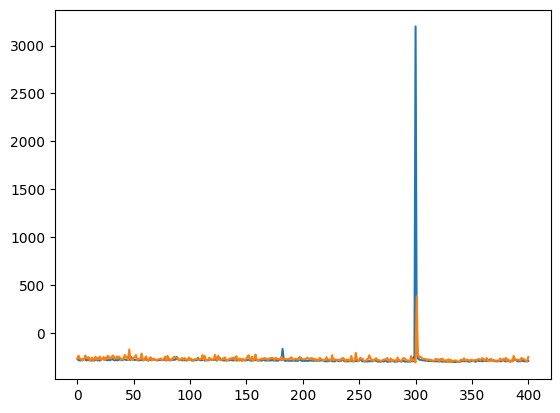

train_weighted_vae: enc
train: iter 0  trainloss -296.73881  validloss -236.15617±0.00000  bestvalidloss -236.15617  last_update 0
train: iter 1  trainloss -298.54531  validloss -289.57406±0.00000  bestvalidloss -289.57406  last_update 0
train: iter 2  trainloss -297.33302  validloss -283.79882±0.00000  bestvalidloss -289.57406  last_update 1
train: iter 3  trainloss -294.88907  validloss -286.13444±0.00000  bestvalidloss -289.57406  last_update 2
train: iter 4  trainloss -298.33128  validloss -275.53174±0.00000  bestvalidloss -289.57406  last_update 3
train: iter 5  trainloss -297.79402  validloss -262.89783±0.00000  bestvalidloss -289.57406  last_update 4
train: iter 6  trainloss -295.80074  validloss -283.88878±0.00000  bestvalidloss -289.57406  last_update 5
train: iter 7  trainloss -298.21983  validloss -282.89875±0.00000  bestvalidloss -289.57406  last_update 6
train: iter 8  trainloss -298.64572  validloss -289.90749±0.00000  bestvalidloss -289.90749  last_update 0
train: iter 9

train: iter 78  trainloss -300.08603  validloss -292.45729±0.00000  bestvalidloss -298.33105  last_update 21
train: iter 79  trainloss -298.77196  validloss -285.26165±0.00000  bestvalidloss -298.33105  last_update 22
train: iter 80  trainloss -293.84723  validloss -295.76589±0.00000  bestvalidloss -298.33105  last_update 23
train: iter 81  trainloss -293.86535  validloss -294.02061±0.00000  bestvalidloss -298.33105  last_update 24
train: iter 82  trainloss -296.47496  validloss -277.20383±0.00000  bestvalidloss -298.33105  last_update 25
train: iter 83  trainloss -299.33026  validloss -286.14520±0.00000  bestvalidloss -298.33105  last_update 26
train: iter 84  trainloss -297.46894  validloss -283.09802±0.00000  bestvalidloss -298.33105  last_update 27
train: iter 85  trainloss -297.88427  validloss -275.98845±0.00000  bestvalidloss -298.33105  last_update 28
train: iter 86  trainloss -295.07269  validloss -249.16341±0.00000  bestvalidloss -298.33105  last_update 29
train: iter 87  tra

train: iter 153  trainloss -297.89335  validloss -285.50042±0.00000  bestvalidloss -301.35669  last_update 25
train: iter 154  trainloss -294.69654  validloss -298.04910±0.00000  bestvalidloss -301.35669  last_update 26
train: iter 155  trainloss -298.68139  validloss -275.58454±0.00000  bestvalidloss -301.35669  last_update 27
train: iter 156  trainloss -297.13876  validloss -279.49993±0.00000  bestvalidloss -301.35669  last_update 28
train: iter 157  trainloss -293.98057  validloss -299.52416±0.00000  bestvalidloss -301.35669  last_update 29
train: iter 158  trainloss -298.29910  validloss -297.88246±0.00000  bestvalidloss -301.35669  last_update 30
train: iter 159  trainloss -299.54085  validloss -283.81266±0.00000  bestvalidloss -301.35669  last_update 31
train: iter 160  trainloss -299.82711  validloss -284.86462±0.00000  bestvalidloss -301.35669  last_update 32
train: iter 161  trainloss -297.83609  validloss -292.56590±0.00000  bestvalidloss -301.35669  last_update 33
train: ite

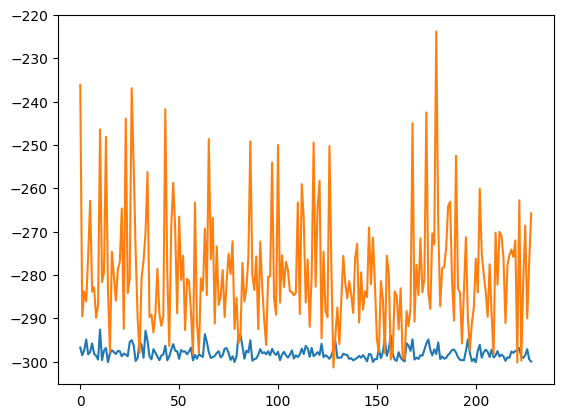

train_weighted_vae: dec
train: iter 0  trainloss -295.48668  validloss -290.70906±0.00000  bestvalidloss -290.70906  last_update 0
train: iter 1  trainloss -299.13433  validloss -282.49172±0.00000  bestvalidloss -290.70906  last_update 1
train: iter 2  trainloss -293.69166  validloss -288.06317±0.00000  bestvalidloss -290.70906  last_update 2
train: iter 3  trainloss -292.60687  validloss -265.76343±0.00000  bestvalidloss -290.70906  last_update 3
train: iter 4  trainloss -294.94306  validloss -284.42908±0.00000  bestvalidloss -290.70906  last_update 4
train: iter 5  trainloss -297.81786  validloss -278.17730±0.00000  bestvalidloss -290.70906  last_update 5
train: iter 6  trainloss -298.25049  validloss -290.82051±0.00000  bestvalidloss -290.82051  last_update 0
train: iter 7  trainloss -298.97732  validloss -276.58078±0.00000  bestvalidloss -290.82051  last_update 1
train: iter 8  trainloss -298.75824  validloss -283.94983±0.00000  bestvalidloss -290.82051  last_update 2
train: iter 9

train: iter 76  trainloss -296.71960  validloss -284.73006±0.00000  bestvalidloss -293.23940  last_update 42
train: iter 77  trainloss -295.20002  validloss -271.41638±0.00000  bestvalidloss -293.23940  last_update 43
train: iter 78  trainloss -295.72327  validloss -270.97162±0.00000  bestvalidloss -293.23940  last_update 44
train: iter 79  trainloss -298.09629  validloss -265.38461±0.00000  bestvalidloss -293.23940  last_update 45
train: iter 80  trainloss -300.16694  validloss -270.98310±0.00000  bestvalidloss -293.23940  last_update 46
train: iter 81  trainloss -298.75414  validloss -280.38749±0.00000  bestvalidloss -293.23940  last_update 47
train: iter 82  trainloss -296.14426  validloss -275.41725±0.00000  bestvalidloss -293.23940  last_update 48
train: iter 83  trainloss -295.16682  validloss -282.42415±0.00000  bestvalidloss -293.23940  last_update 49
train: iter 84  trainloss -296.00921  validloss -267.77959±0.00000  bestvalidloss -293.23940  last_update 50
train: iter 85  tra

train: iter 153  trainloss -285.67690  validloss -278.05024±0.00000  bestvalidloss -297.02634  last_update 54
train: iter 154  trainloss -300.12039  validloss -280.78060±0.00000  bestvalidloss -297.02634  last_update 55
train: iter 155  trainloss -301.51827  validloss -270.68835±0.00000  bestvalidloss -297.02634  last_update 56
train: iter 156  trainloss -300.67924  validloss -273.79001±0.00000  bestvalidloss -297.02634  last_update 57
train: iter 157  trainloss -303.08906  validloss -294.14990±0.00000  bestvalidloss -297.02634  last_update 58
train: iter 158  trainloss -299.15342  validloss -276.89357±0.00000  bestvalidloss -297.02634  last_update 59
train: iter 159  trainloss -300.47315  validloss -287.81575±0.00000  bestvalidloss -297.02634  last_update 60
train: iter 160  trainloss -298.93704  validloss -282.31736±0.00000  bestvalidloss -297.02634  last_update 61
train: iter 161  trainloss -293.68313  validloss -291.55081±0.00000  bestvalidloss -297.02634  last_update 62
train: ite

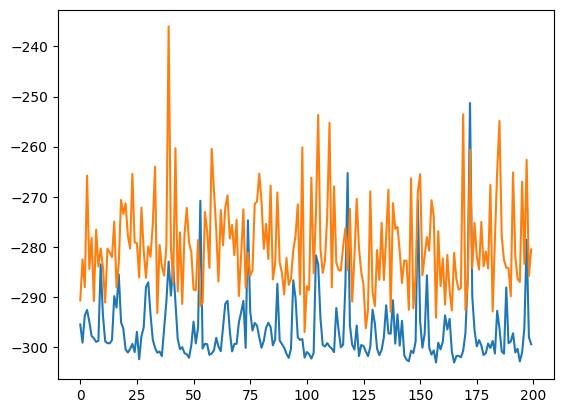

alpha 0.3 vae_lr 0.0005


In [27]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()


print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])


 0 4.76837158203125e-07
c = 0.06360799669327234

 1 2.194589138031006
c = 0.27891742906153094

 2 2.2352406978607178
c = 0.198326285168933

 3 2.1327598094940186
c = 0.0704896356600662

 4 2.147536277770996
c = 0.0533506733878912

 5 2.2033607959747314
c = 0.15092694543636426

 6 2.1820363998413086
c = 0.13450511078737207

 7 2.0790138244628906
c = 0.25257673496415617

 8 2.212965726852417
c = 0.044106635439375895

 9 2.2688329219818115
c = 0.08641402533405439

 10 2.23785138130188
c = 0.06398137428895548

 11 2.119448184967041
c = 0.06650398275505662

 12 2.1469779014587402
c = 0.23677902262401807

 13 2.194802761077881
c = 0.10894729939258753

 14 2.252962589263916
c = 0.018908185588163706

 15 2.2159006595611572
c = 0.0776225824102389

 16 2.2224323749542236
c = 0.06572693887605882

 17 2.213027000427246
c = 0.22107324169160675

 18 2.266740083694458
c = 0.16524647498154205

 19 2.1044907569885254
c = 0.16430453562814015

 20 2.1372218132019043
c = 0.10721230111655967

 21 2.175112


 74 2.2304813861846924
c = 0.23081404192396093

 75 2.200500249862671
c = 0.2998556948757134

 76 2.3435208797454834
c = 0.12284047204677542

 77 2.2589023113250732
c = 0.011059974816928286

 78 2.1897695064544678
c = 0.04813155706029872

 79 2.1786179542541504
c = 0.07209887942005372

 80 2.203915596008301
c = 0.26955463734962504

 81 2.2908568382263184
c = 0.07776610105418298

 82 2.275538921356201
c = 0.10158900714709537

 83 2.29376220703125
c = 0.15112558831897702

 84 2.305800437927246
c = 0.05719235843497191

 85 2.3040528297424316
c = 0.016780942726192894

 86 2.2341573238372803
c = 0.14031317202562898

 87 2.1598265171051025
c = 0.24871375519386724

 88 2.186123847961426
c = 0.05188036230536682

 89 2.210536003112793
c = 0.22063980836423655

 90 2.2286901473999023
c = 0.2950026969965437

 91 2.2271509170532227
c = 0.015145575434677238

 92 2.1681838035583496
c = 0.2122675461338058

 93 2.2881524562835693
c = 0.040844855803886713

 94 2.2174763679504395
c = 0.22491369339858866

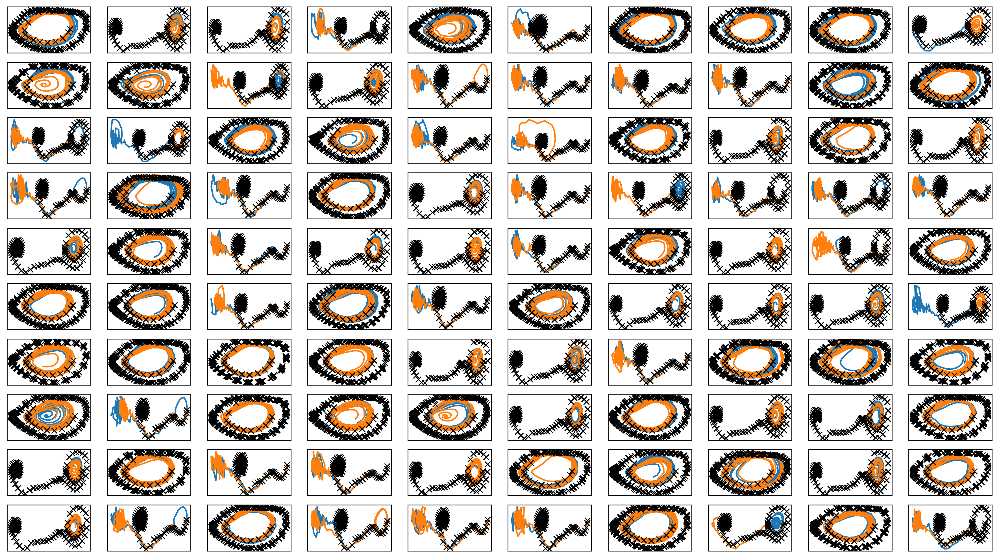

In [28]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter2.png")
plt.savefig(figfilenamehead+"joint_iter2.eps")
plt.savefig(figfilenamehead+"joint_iter2.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

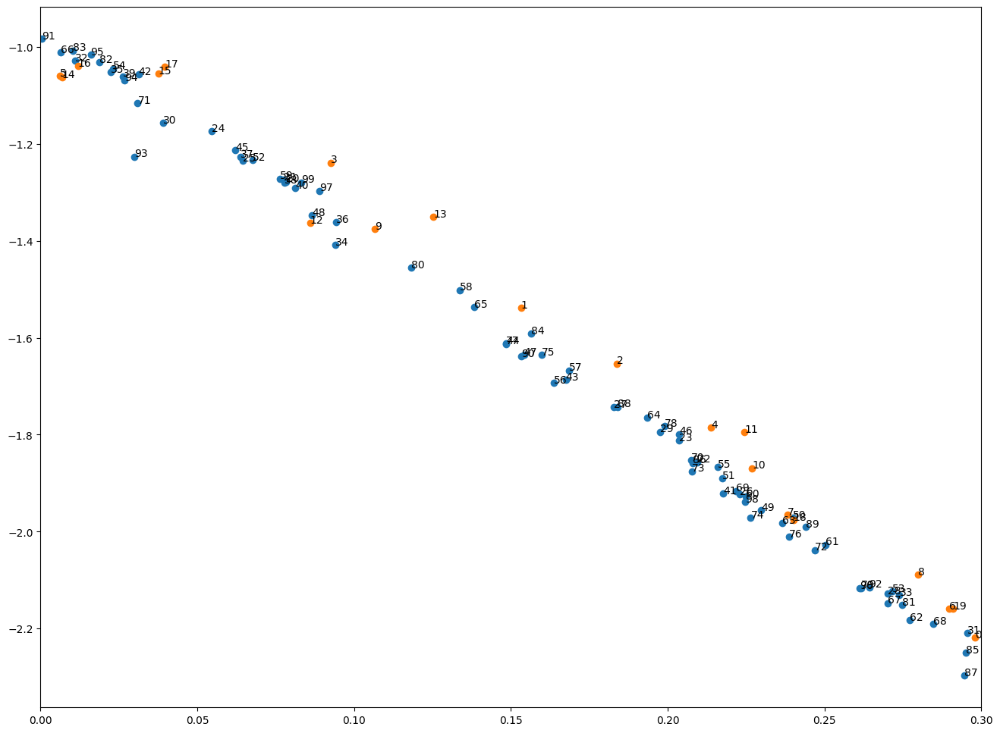

[0.29791016 0.15322083 0.18365987 0.09261918 0.21384459 0.00627838
 0.28977922 0.23826577 0.27982297 0.10656002]
[0.22693388 0.2244697  0.08596681 0.12522523 0.00685178 0.03757813
 0.01196297 0.03966669 0.24002473 0.29092061]
[0.07835583 0.07746172 0.20934208 0.20371297 0.05450337 0.06451795
 0.2229776  0.1828022  0.27007945 0.19762321]
[0.03898917 0.29555121 0.01093391 0.27386888 0.09397505 0.02248499
 0.09414549 0.06385285 0.07767223 0.02632497]
[0.08125716 0.21770374 0.03126921 0.1674378  0.14847363 0.06205282
 0.20363688 0.15417275 0.08645989 0.22978046]
[0.23991758 0.21743357 0.06757306 0.2714981  0.02319353 0.21589278
 0.16356097 0.16844176 0.13367955 0.07634676]
[0.22476822 0.25029279 0.2771417  0.23638723 0.19333075 0.13834196
 0.00632632 0.27019082 0.28455401 0.22163373]
[0.20737241 0.03096922 0.24692379 0.20760993 0.22644138 0.1598574
 0.23863549 0.1484238  0.19891706 0.26157098]
[0.11830818 0.27478066 0.01872246 0.01027625 0.15642099 0.29498274
 0.20786144 0.29459763 0.18393

In [29]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter2.png")
plt.savefig(figfilenamehead+"damping_latent_iter2.eps")
plt.savefig(figfilenamehead+"damping_latent_iter2.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [30]:
print(datetime.datetime.now())

2023-04-12 14:53:52.482158


# Iter 3

In [31]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()


 0
c = 0.10143677071128325
c = 0.14037178051235236
c = 0.12217001201926418
c = 0.19923500409772874
c = 0.04557650764729665
c = 0.004463922742455406
c = 0.24590201845042314
c = 0.01939649011613055
c = 0.16646047293766394
c = 0.21184025831510991
c = 0.007089054773221737

 1
c = 0.15362987850598928
c = 0.10240464917670516
c = 0.11915883948504173
c = 0.11495704726724272
c = 0.2778781048203262
c = 0.16492575139090965
c = 0.07521216048791714
c = 0.2343453692817276
c = 0.010705797398113526
c = 0.061152417179193196

 2
c = 0.07159757686204392
c = 0.27683905372013573
c = 0.2929042045405407
c = 0.018354941314563465
c = 0.23486187815581458
c = 0.1370593954342374
c = 0.27519893762492925
c = 0.27440185063809686
c = 0.02321336130119589
c = 0.02124279283785917
c = 0.24663490782727085
c = 0.0035345422851367657
c = 0.2138214998350688
c = 0.11712153491338158
c = 0.026382393829457784
c = 0.13753590733950216
c = 0.15512300780671862

 3
c = 0.27907640903317144
c = 0.22483842647594376
c = 0.003501729953062

c = 0.0919493053265837
c = 0.09319200187832517
c = 0.007892082852715964
c = 0.2177985865599298
c = 0.23565361803391885
c = 0.14150158518232753
c = 0.06898819350824957

 28
c = 0.2873420024101468
c = 0.28048179131664003
c = 0.17932863038578448
c = 0.29351618029772575
c = 0.1411175640014679
c = 0.08213741912264472
c = 0.20799847439417654
c = 0.03318210076573125
c = 0.2759302263954833
c = 0.1412033529033361
c = 0.2370599531284831
c = 0.05248135897735373
c = 0.2385564777365801
c = 0.11763253773665688
c = 0.10586417379030587
c = 0.2975483594096222
c = 0.18512218017858303
c = 0.2601078184710839
c = 0.03995505085973692

 29
c = 0.05048316834205275
c = 0.1836017031900794
c = 0.10799770972425507
c = 0.2700895242751125
c = 0.17729340068478652
c = 0.023800395998186584
c = 0.19469125968211173
c = 0.03084963471793893
c = 0.11899685472345187
c = 0.13743028456236353
c = 0.1382870747545908
c = 0.13906599186853089

 30
c = 0.28230993174015173
c = 0.015279690692699577
c = 0.2152759156105246
c = 0.209532

c = 0.08042759993903927

 54
c = 0.2328653876539216
c = 0.008486006896516763
c = 0.1768850723703683
c = 0.0557182335361053
c = 0.1358470426595794
c = 0.22428388188044862
c = 0.026310859409576136
c = 0.09300840929230654
c = 0.2740850411637375

 55
c = 0.1338876663334772
c = 0.23576646835522744
c = 0.1363462619646299
c = 0.049747896402537
c = 0.16193028752884672
c = 0.03293747202839892
c = 0.021989571445544587
c = 0.23874930618165213
c = 0.008097821594918453
c = 0.2557162802786188
c = 0.058830079478144344
c = 0.059688876986175615
c = 0.18175888448070543
c = 0.21230500616492395
c = 0.1473240074701406
c = 0.1420159015248138
c = 0.19261851170514513
c = 0.2913620813433271

 56
c = 0.1684798235084007
c = 0.029110566359662724
c = 0.05224390869478441
c = 0.25158423171651684
c = 0.16912652281363674
c = 0.11973261786610506
c = 0.15173466904103913
c = 0.2320424296581315
c = 0.21087240855273753
c = 0.10975422481940351

 57
c = 0.10193196092677935
c = 0.03381041027453215
c = 0.04127597985954335
c = 

c = 0.2852588689647671
c = 0.2524018988575267
c = 0.1888730496354873
c = 0.10106744978658434
c = 0.08060272452457543
c = 9.069632118496873e-06
c = 0.23806247249152024
c = 0.034390168508796955
c = 0.1632277756385316
c = 0.08499539065438518

 81
c = 0.09696537664053727
c = 0.13277244647801673
c = 0.022814245009762223
c = 0.28275256153944595
c = 0.2903921468392431
c = 0.12295023426452625
c = 0.2711027355091421
c = 0.29069795435344364
c = 0.028145919021819076
c = 0.20064705195109594
c = 0.267239000251716

 82
c = 0.10307058672758239
c = 0.17670974442176066
c = 0.10612791283071955
c = 0.117183315301143
c = 0.2938380512423214
c = 0.28224332007665875
c = 0.18701574528583076
c = 0.2694863145767233
c = 0.159149350952951

 83
c = 0.17701387954135064
c = 0.26506953732315724
c = 0.027503318389113095
c = 0.13431520970985303
c = 0.08794251702057954
c = 0.010552224881808958
c = 0.1533240740378473
c = 0.0732215079677598
c = 0.055373664876708036
c = 0.15749805370123857
c = 0.034965583560839696
c = 0.25

In [32]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)



train: iter 0  trainloss 0.32023  validloss 0.34063±0.00000  bestvalidloss 0.34063  last_update 0
train: iter 1  trainloss 0.31398  validloss 0.29566±0.00000  bestvalidloss 0.29566  last_update 0
train: iter 2  trainloss 0.30893  validloss 0.29265±0.00000  bestvalidloss 0.29265  last_update 0
train: iter 3  trainloss 0.31033  validloss 0.30594±0.00000  bestvalidloss 0.29265  last_update 1
train: iter 4  trainloss 0.30971  validloss 0.29061±0.00000  bestvalidloss 0.29061  last_update 0
train: iter 5  trainloss 0.30666  validloss 0.29088±0.00000  bestvalidloss 0.29061  last_update 1
train: iter 6  trainloss 0.30690  validloss 0.29070±0.00000  bestvalidloss 0.29061  last_update 2
train: iter 7  trainloss 0.30564  validloss 0.29241±0.00000  bestvalidloss 0.29061  last_update 3
train: iter 8  trainloss 0.30446  validloss 0.29047±0.00000  bestvalidloss 0.29047  last_update 0
train: iter 9  trainloss 0.30230  validloss 0.28959±0.00000  bestvalidloss 0.28959  last_update 0
train: iter 10  trai

train: iter 83  trainloss 0.29007  validloss 0.29315±0.00000  bestvalidloss 0.28454  last_update 7
train: iter 84  trainloss 0.29115  validloss 0.28478±0.00000  bestvalidloss 0.28454  last_update 8
train: iter 85  trainloss 0.29218  validloss 0.29230±0.00000  bestvalidloss 0.28454  last_update 9
train: iter 86  trainloss 0.29311  validloss 0.29232±0.00000  bestvalidloss 0.28454  last_update 10
train: iter 87  trainloss 0.28992  validloss 0.28662±0.00000  bestvalidloss 0.28454  last_update 11
train: iter 88  trainloss 0.29038  validloss 0.29678±0.00000  bestvalidloss 0.28454  last_update 12
train: iter 89  trainloss 0.29039  validloss 0.29008±0.00000  bestvalidloss 0.28454  last_update 13
train: iter 90  trainloss 0.28984  validloss 0.29140±0.00000  bestvalidloss 0.28454  last_update 14
train: iter 91  trainloss 0.29001  validloss 0.28674±0.00000  bestvalidloss 0.28454  last_update 15
train: iter 92  trainloss 0.28928  validloss 0.28730±0.00000  bestvalidloss 0.28454  last_update 16
tra

train: iter 166  trainloss 0.28562  validloss 0.28473±0.00000  bestvalidloss 0.28341  last_update 36
train: iter 167  trainloss 0.28596  validloss 0.28369±0.00000  bestvalidloss 0.28341  last_update 37
train: iter 168  trainloss 0.28676  validloss 0.28190±0.00000  bestvalidloss 0.28190  last_update 0
train: iter 169  trainloss 0.28563  validloss 0.28527±0.00000  bestvalidloss 0.28190  last_update 1
train: iter 170  trainloss 0.28581  validloss 0.28302±0.00000  bestvalidloss 0.28190  last_update 2
train: iter 171  trainloss 0.28673  validloss 0.29375±0.00000  bestvalidloss 0.28190  last_update 3
train: iter 172  trainloss 0.28675  validloss 0.28651±0.00000  bestvalidloss 0.28190  last_update 4
train: iter 173  trainloss 0.28640  validloss 0.28287±0.00000  bestvalidloss 0.28190  last_update 5
train: iter 174  trainloss 0.28506  validloss 0.29011±0.00000  bestvalidloss 0.28190  last_update 6
train: iter 175  trainloss 0.28660  validloss 0.28785±0.00000  bestvalidloss 0.28190  last_update 

train: iter 248  trainloss 0.28289  validloss 0.28494±0.00000  bestvalidloss 0.28082  last_update 36
train: iter 249  trainloss 0.28302  validloss 0.28461±0.00000  bestvalidloss 0.28082  last_update 37
train: iter 250  trainloss 0.28149  validloss 0.28398±0.00000  bestvalidloss 0.28082  last_update 38
train: iter 251  trainloss 0.28251  validloss 0.28632±0.00000  bestvalidloss 0.28082  last_update 39
train: iter 252  trainloss 0.28227  validloss 0.28441±0.00000  bestvalidloss 0.28082  last_update 40
train: iter 253  trainloss 0.28319  validloss 0.28548±0.00000  bestvalidloss 0.28082  last_update 41
train: iter 254  trainloss 0.28095  validloss 0.28236±0.00000  bestvalidloss 0.28082  last_update 42
train: iter 255  trainloss 0.28159  validloss 0.28329±0.00000  bestvalidloss 0.28082  last_update 43
train: iter 256  trainloss 0.28149  validloss 0.28223±0.00000  bestvalidloss 0.28082  last_update 44
train: iter 257  trainloss 0.28210  validloss 0.28149±0.00000  bestvalidloss 0.28082  last_

train: iter 330  trainloss 0.28179  validloss 0.27937±0.00000  bestvalidloss 0.27890  last_update 7
train: iter 331  trainloss 0.28197  validloss 0.28715±0.00000  bestvalidloss 0.27890  last_update 8
train: iter 332  trainloss 0.28061  validloss 0.28143±0.00000  bestvalidloss 0.27890  last_update 9
train: iter 333  trainloss 0.27916  validloss 0.28279±0.00000  bestvalidloss 0.27890  last_update 10
train: iter 334  trainloss 0.27978  validloss 0.28349±0.00000  bestvalidloss 0.27890  last_update 11
train: iter 335  trainloss 0.27982  validloss 0.28048±0.00000  bestvalidloss 0.27890  last_update 12
train: iter 336  trainloss 0.27912  validloss 0.28367±0.00000  bestvalidloss 0.27890  last_update 13
train: iter 337  trainloss 0.28074  validloss 0.28062±0.00000  bestvalidloss 0.27890  last_update 14
train: iter 338  trainloss 0.27915  validloss 0.28817±0.00000  bestvalidloss 0.27890  last_update 15
train: iter 339  trainloss 0.28069  validloss 0.28335±0.00000  bestvalidloss 0.27890  last_upd

train: iter 412  trainloss 0.27881  validloss 0.27901±0.00000  bestvalidloss 0.27805  last_update 15
train: iter 413  trainloss 0.27821  validloss 0.27984±0.00000  bestvalidloss 0.27805  last_update 16
train: iter 414  trainloss 0.27755  validloss 0.27995±0.00000  bestvalidloss 0.27805  last_update 17
train: iter 415  trainloss 0.27743  validloss 0.27991±0.00000  bestvalidloss 0.27805  last_update 18
train: iter 416  trainloss 0.27944  validloss 0.28032±0.00000  bestvalidloss 0.27805  last_update 19
train: iter 417  trainloss 0.27816  validloss 0.28377±0.00000  bestvalidloss 0.27805  last_update 20
train: iter 418  trainloss 0.27892  validloss 0.28414±0.00000  bestvalidloss 0.27805  last_update 21
train: iter 419  trainloss 0.27800  validloss 0.28734±0.00000  bestvalidloss 0.27805  last_update 22
train: iter 420  trainloss 0.27839  validloss 0.27825±0.00000  bestvalidloss 0.27805  last_update 23
train: iter 421  trainloss 0.27755  validloss 0.28050±0.00000  bestvalidloss 0.27805  last_

train: iter 494  trainloss 0.27660  validloss 0.28155±0.00000  bestvalidloss 0.27699  last_update 37
train: iter 495  trainloss 0.27586  validloss 0.27958±0.00000  bestvalidloss 0.27699  last_update 38
train: iter 496  trainloss 0.27408  validloss 0.28163±0.00000  bestvalidloss 0.27699  last_update 39
train: iter 497  trainloss 0.27372  validloss 0.28610±0.00000  bestvalidloss 0.27699  last_update 40
train: iter 498  trainloss 0.27437  validloss 0.27720±0.00000  bestvalidloss 0.27699  last_update 41
train: iter 499  trainloss 0.27620  validloss 0.27982±0.00000  bestvalidloss 0.27699  last_update 42
train: iter 500  trainloss 0.27461  validloss 0.28181±0.00000  bestvalidloss 0.27699  last_update 43
train: iter 501  trainloss 0.27495  validloss 0.28170±0.00000  bestvalidloss 0.27699  last_update 44
train: iter 502  trainloss 0.27469  validloss 0.28009±0.00000  bestvalidloss 0.27699  last_update 45
train: iter 503  trainloss 0.27466  validloss 0.28197±0.00000  bestvalidloss 0.27699  last_

train: iter 577  trainloss 0.27317  validloss 0.28376±0.00000  bestvalidloss 0.27683  last_update 19
train: iter 578  trainloss 0.27506  validloss 0.27801±0.00000  bestvalidloss 0.27683  last_update 20
train: iter 579  trainloss 0.27487  validloss 0.27909±0.00000  bestvalidloss 0.27683  last_update 21
train: iter 580  trainloss 0.27351  validloss 0.28496±0.00000  bestvalidloss 0.27683  last_update 22
train: iter 581  trainloss 0.27355  validloss 0.28155±0.00000  bestvalidloss 0.27683  last_update 23
train: iter 582  trainloss 0.27486  validloss 0.27873±0.00000  bestvalidloss 0.27683  last_update 24
train: iter 583  trainloss 0.27496  validloss 0.27665±0.00000  bestvalidloss 0.27665  last_update 0
train: iter 584  trainloss 0.27248  validloss 0.28249±0.00000  bestvalidloss 0.27665  last_update 1
train: iter 585  trainloss 0.27336  validloss 0.28083±0.00000  bestvalidloss 0.27665  last_update 2
train: iter 586  trainloss 0.27333  validloss 0.28227±0.00000  bestvalidloss 0.27665  last_upd

train: iter 659  trainloss 0.27372  validloss 0.28071±0.00000  bestvalidloss 0.27579  last_update 7
train: iter 660  trainloss 0.27133  validloss 0.27782±0.00000  bestvalidloss 0.27579  last_update 8
train: iter 661  trainloss 0.27145  validloss 0.28076±0.00000  bestvalidloss 0.27579  last_update 9
train: iter 662  trainloss 0.27258  validloss 0.28092±0.00000  bestvalidloss 0.27579  last_update 10
train: iter 663  trainloss 0.27185  validloss 0.28068±0.00000  bestvalidloss 0.27579  last_update 11
train: iter 664  trainloss 0.27358  validloss 0.28278±0.00000  bestvalidloss 0.27579  last_update 12
train: iter 665  trainloss 0.27185  validloss 0.28426±0.00000  bestvalidloss 0.27579  last_update 13
train: iter 666  trainloss 0.27099  validloss 0.27959±0.00000  bestvalidloss 0.27579  last_update 14
train: iter 667  trainloss 0.27259  validloss 0.27798±0.00000  bestvalidloss 0.27579  last_update 15
train: iter 668  trainloss 0.27322  validloss 0.28639±0.00000  bestvalidloss 0.27579  last_upd

train: iter 742  trainloss 0.27187  validloss 0.27972±0.00000  bestvalidloss 0.27440  last_update 27
train: iter 743  trainloss 0.27152  validloss 0.27958±0.00000  bestvalidloss 0.27440  last_update 28
train: iter 744  trainloss 0.27043  validloss 0.27991±0.00000  bestvalidloss 0.27440  last_update 29
train: iter 745  trainloss 0.27076  validloss 0.27740±0.00000  bestvalidloss 0.27440  last_update 30
train: iter 746  trainloss 0.27213  validloss 0.28292±0.00000  bestvalidloss 0.27440  last_update 31
train: iter 747  trainloss 0.26997  validloss 0.27824±0.00000  bestvalidloss 0.27440  last_update 32
train: iter 748  trainloss 0.27053  validloss 0.28136±0.00000  bestvalidloss 0.27440  last_update 33
train: iter 749  trainloss 0.27121  validloss 0.28361±0.00000  bestvalidloss 0.27440  last_update 34
train: iter 750  trainloss 0.27031  validloss 0.27814±0.00000  bestvalidloss 0.27440  last_update 35
train: iter 751  trainloss 0.26958  validloss 0.28206±0.00000  bestvalidloss 0.27440  last_

In [33]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


train_loss:  -438.7953654512763
valid_loss:  -460.9576528930664
train_loss:  -271.91386568367477
valid_loss:  -259.38704467773437


1e-08 1000.0


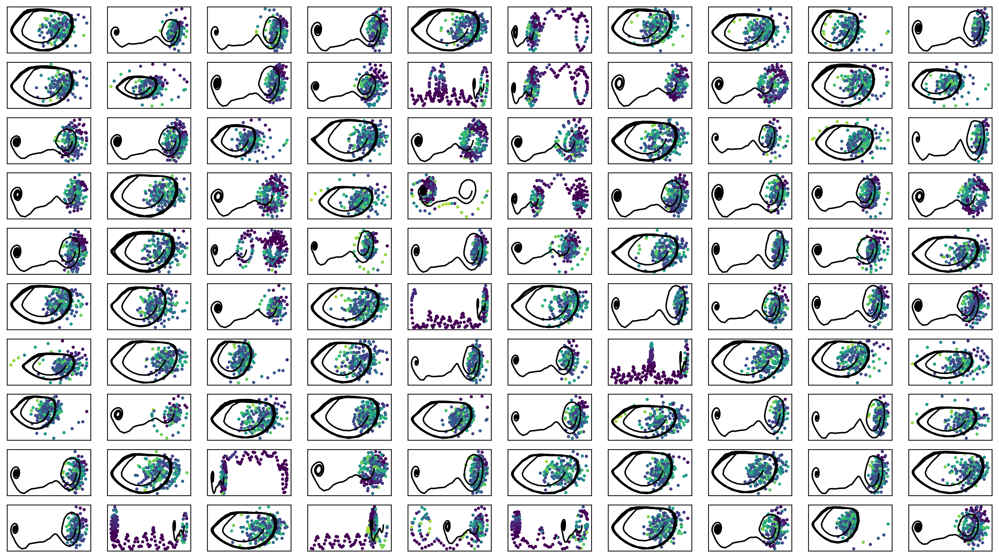

In [34]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter3.png")

In [35]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [36]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [37]:
# i = 49
# plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1])
# plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
# # plt.plot(simdata1b[i][:,0], simdata1b[i][:,1]) 
# plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#            # vmin=f(min_val), vmax=f(max_val)
#            )
# plt.colorbar()

train_weighted_vae: enc_dec
train: iter 0  trainloss -266.35568  validloss -259.59125±0.00000  bestvalidloss -259.59125  last_update 0
train: iter 1  trainloss -273.09100  validloss -267.35672±0.00000  bestvalidloss -267.35672  last_update 0
train: iter 2  trainloss -264.63739  validloss -257.65442±0.00000  bestvalidloss -267.35672  last_update 1
train: iter 3  trainloss -268.18124  validloss -264.02813±0.00000  bestvalidloss -267.35672  last_update 2
train: iter 4  trainloss -272.04773  validloss -269.75780±0.00000  bestvalidloss -269.75780  last_update 0
train: iter 5  trainloss -263.84143  validloss -253.88926±0.00000  bestvalidloss -269.75780  last_update 1
train: iter 6  trainloss -271.99576  validloss -226.58602±0.00000  bestvalidloss -269.75780  last_update 2
train: iter 7  trainloss -271.66033  validloss -245.90682±0.00000  bestvalidloss -269.75780  last_update 3
train: iter 8  trainloss -269.15592  validloss -264.73173±0.00000  bestvalidloss -269.75780  last_update 4
train: it

train: iter 77  trainloss -269.87853  validloss -261.15683±0.00000  bestvalidloss -276.92038  last_update 9
train: iter 78  trainloss -263.00549  validloss -258.50673±0.00000  bestvalidloss -276.92038  last_update 10
train: iter 79  trainloss -263.90001  validloss -268.07984±0.00000  bestvalidloss -276.92038  last_update 11
train: iter 80  trainloss -263.62193  validloss -259.55667±0.00000  bestvalidloss -276.92038  last_update 12
train: iter 81  trainloss -263.86138  validloss -269.22213±0.00000  bestvalidloss -276.92038  last_update 13
train: iter 82  trainloss -257.77751  validloss -261.34742±0.00000  bestvalidloss -276.92038  last_update 14
train: iter 83  trainloss -265.44624  validloss -274.10838±0.00000  bestvalidloss -276.92038  last_update 15
train: iter 84  trainloss -269.14878  validloss -244.07381±0.00000  bestvalidloss -276.92038  last_update 16
train: iter 85  trainloss -270.65376  validloss -265.32135±0.00000  bestvalidloss -276.92038  last_update 17
train: iter 86  trai

train: iter 152  trainloss -260.50830  validloss -265.53584±0.00000  bestvalidloss -276.92038  last_update 84
train: iter 153  trainloss -262.23606  validloss -234.61261±0.00000  bestvalidloss -276.92038  last_update 85
train: iter 154  trainloss -270.00656  validloss -257.64832±0.00000  bestvalidloss -276.92038  last_update 86
train: iter 155  trainloss -266.78431  validloss -268.79405±0.00000  bestvalidloss -276.92038  last_update 87
train: iter 156  trainloss -264.74538  validloss -264.52668±0.00000  bestvalidloss -276.92038  last_update 88
train: iter 157  trainloss -266.46688  validloss -260.21990±0.00000  bestvalidloss -276.92038  last_update 89
train: iter 158  trainloss -267.96709  validloss -267.30001±0.00000  bestvalidloss -276.92038  last_update 90
train: iter 159  trainloss -269.96588  validloss -246.02064±0.00000  bestvalidloss -276.92038  last_update 91
train: iter 160  trainloss -269.77942  validloss -268.76237±0.00000  bestvalidloss -276.92038  last_update 92
train: ite

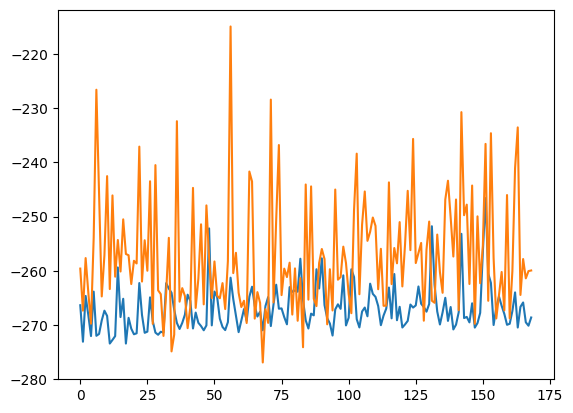

train_weighted_vae: enc
train: iter 0  trainloss -265.93731  validloss -259.72785±0.00000  bestvalidloss -259.72785  last_update 0
train: iter 1  trainloss -267.47016  validloss -261.16713±0.00000  bestvalidloss -261.16713  last_update 0
train: iter 2  trainloss -265.95659  validloss -250.11398±0.00000  bestvalidloss -261.16713  last_update 1
train: iter 3  trainloss -268.32475  validloss -253.25175±0.00000  bestvalidloss -261.16713  last_update 2
train: iter 4  trainloss -267.12012  validloss -254.92065±0.00000  bestvalidloss -261.16713  last_update 3
train: iter 5  trainloss -267.36998  validloss -264.95541±0.00000  bestvalidloss -264.95541  last_update 0
train: iter 6  trainloss -265.87161  validloss -261.04191±0.00000  bestvalidloss -264.95541  last_update 1
train: iter 7  trainloss -266.43971  validloss -250.19490±0.00000  bestvalidloss -264.95541  last_update 2
train: iter 8  trainloss -266.45842  validloss -248.84290±0.00000  bestvalidloss -264.95541  last_update 3
train: iter 9

train: iter 76  trainloss -267.06323  validloss -261.45156±0.00000  bestvalidloss -265.76458  last_update 14
train: iter 77  trainloss -267.87312  validloss -264.35402±0.00000  bestvalidloss -265.76458  last_update 15
train: iter 78  trainloss -267.02757  validloss -253.68436±0.00000  bestvalidloss -265.76458  last_update 16
train: iter 79  trainloss -268.09606  validloss -254.59755±0.00000  bestvalidloss -265.76458  last_update 17
train: iter 80  trainloss -266.49756  validloss -263.81488±0.00000  bestvalidloss -265.76458  last_update 18
train: iter 81  trainloss -267.18754  validloss -259.71099±0.00000  bestvalidloss -265.76458  last_update 19
train: iter 82  trainloss -267.18430  validloss -261.57292±0.00000  bestvalidloss -265.76458  last_update 20
train: iter 83  trainloss -267.46982  validloss -244.64448±0.00000  bestvalidloss -265.76458  last_update 21
train: iter 84  trainloss -268.23742  validloss -255.93554±0.00000  bestvalidloss -265.76458  last_update 22
train: iter 85  tra

train: iter 151  trainloss -267.91567  validloss -245.49015±0.00000  bestvalidloss -265.76458  last_update 89
train: iter 152  trainloss -264.32923  validloss -236.62025±0.00000  bestvalidloss -265.76458  last_update 90
train: iter 153  trainloss -266.11274  validloss -251.06911±0.00000  bestvalidloss -265.76458  last_update 91
train: iter 154  trainloss -267.26290  validloss -260.41232±0.00000  bestvalidloss -265.76458  last_update 92
train: iter 155  trainloss -267.75561  validloss -251.27737±0.00000  bestvalidloss -265.76458  last_update 93
train: iter 156  trainloss -265.55200  validloss -258.96951±0.00000  bestvalidloss -265.76458  last_update 94
train: iter 157  trainloss -267.32611  validloss -255.53802±0.00000  bestvalidloss -265.76458  last_update 95
train: iter 158  trainloss -266.22295  validloss -254.68507±0.00000  bestvalidloss -265.76458  last_update 96
train: iter 159  trainloss -265.64327  validloss -245.65801±0.00000  bestvalidloss -265.76458  last_update 97
train: ite

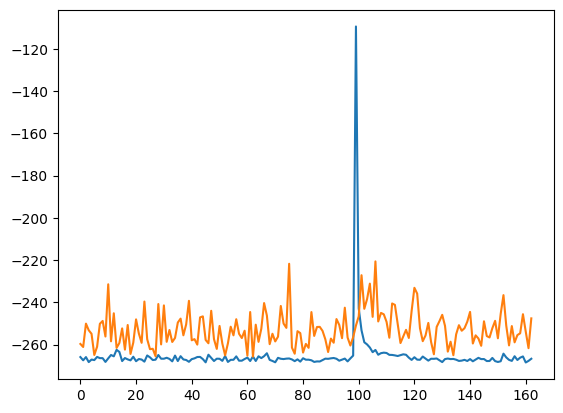

train_weighted_vae: dec
train: iter 0  trainloss -261.41258  validloss -252.31659±0.00000  bestvalidloss -252.31659  last_update 0
train: iter 1  trainloss -268.95227  validloss -260.70162±0.00000  bestvalidloss -260.70162  last_update 0
train: iter 2  trainloss -266.74780  validloss -256.88965±0.00000  bestvalidloss -260.70162  last_update 1
train: iter 3  trainloss -267.36185  validloss -255.02593±0.00000  bestvalidloss -260.70162  last_update 2
train: iter 4  trainloss -268.99410  validloss -258.19550±0.00000  bestvalidloss -260.70162  last_update 3
train: iter 5  trainloss -266.01261  validloss -252.52039±0.00000  bestvalidloss -260.70162  last_update 4
train: iter 6  trainloss -264.05395  validloss -257.05710±0.00000  bestvalidloss -260.70162  last_update 5
train: iter 7  trainloss -259.91712  validloss -256.28312±0.00000  bestvalidloss -260.70162  last_update 6
train: iter 8  trainloss -262.80063  validloss -254.94161±0.00000  bestvalidloss -260.70162  last_update 7
train: iter 9

train: iter 78  trainloss -268.64541  validloss -259.61772±0.00000  bestvalidloss -269.05521  last_update 1
train: iter 79  trainloss -269.08457  validloss -250.96350±0.00000  bestvalidloss -269.05521  last_update 2
train: iter 80  trainloss -269.31427  validloss -258.11795±0.00000  bestvalidloss -269.05521  last_update 3
train: iter 81  trainloss -270.95113  validloss -261.50788±0.00000  bestvalidloss -269.05521  last_update 4
train: iter 82  trainloss -261.88236  validloss -262.30251±0.00000  bestvalidloss -269.05521  last_update 5
train: iter 83  trainloss -259.46137  validloss -260.32158±0.00000  bestvalidloss -269.05521  last_update 6
train: iter 84  trainloss -265.35051  validloss -254.28008±0.00000  bestvalidloss -269.05521  last_update 7
train: iter 85  trainloss -264.63224  validloss -260.04280±0.00000  bestvalidloss -269.05521  last_update 8
train: iter 86  trainloss -268.97438  validloss -262.17843±0.00000  bestvalidloss -269.05521  last_update 9
train: iter 87  trainloss -2

train: iter 153  trainloss -269.46986  validloss -267.84372±0.00000  bestvalidloss -269.05521  last_update 76
train: iter 154  trainloss -270.68429  validloss -258.76217±0.00000  bestvalidloss -269.05521  last_update 77
train: iter 155  trainloss -271.79292  validloss -259.51064±0.00000  bestvalidloss -269.05521  last_update 78
train: iter 156  trainloss -270.40964  validloss -262.13398±0.00000  bestvalidloss -269.05521  last_update 79
train: iter 157  trainloss -270.85476  validloss -259.90822±0.00000  bestvalidloss -269.05521  last_update 80
train: iter 158  trainloss -267.89191  validloss -256.37829±0.00000  bestvalidloss -269.05521  last_update 81
train: iter 159  trainloss -269.52323  validloss -263.11428±0.00000  bestvalidloss -269.05521  last_update 82
train: iter 160  trainloss -266.04506  validloss -256.27817±0.00000  bestvalidloss -269.05521  last_update 83
train: iter 161  trainloss -261.55582  validloss -235.03507±0.00000  bestvalidloss -269.05521  last_update 84
train: ite

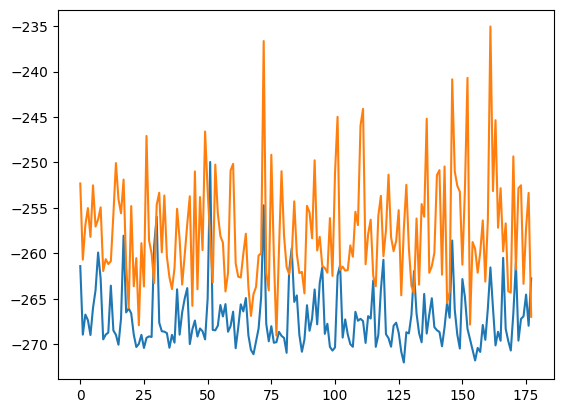

alpha 0.3 vae_lr 0.0005


In [38]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter3.png")
plt.savefig(figfilenamehead+"joint_iter3.eps")
plt.savefig(figfilenamehead+"joint_iter3.pdf")

print("実環境方策rollout vs Sim環境方策rollout")


 0 4.76837158203125e-07
c = 0.03176912463536572

 1 2.2561521530151367
c = 0.20109802242322916

 2 2.278891086578369
c = 0.27033875215112985

 3 2.208313465118408
c = 0.04688227664274519

 4 2.2423245906829834
c = 0.21046143402666176

 5 2.187539577484131
c = 0.25489522285362654

 6 2.223374605178833
c = 0.14211238819616911

 7 2.224524736404419
c = 0.1604329275657784

 8 2.227512836456299
c = 0.0029468680872293484

 9 2.2028284072875977
c = 0.20323377082044136

 10 2.139706611633301
c = 0.05253507238938299

 11 2.252812623977661
c = 0.008870401664409555

 12 2.229088306427002
c = 0.21204792465912428

 13 2.2381932735443115
c = 0.1912587675244377

 14 2.1523849964141846
c = 0.2103996410938147

 15 2.322669744491577
c = 0.19888544673191302

 16 2.2933247089385986
c = 0.25603049087744345

 17 2.273738384246826
c = 0.28282912702948326

 18 2.229917526245117
c = 0.11418814742520433

 19 2.138794183731079
c = 0.021272094352179936

 20 2.165505886077881
c = 0.16747253718820035

 21 2.151072

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter3.png")
plt.savefig(figfilenamehead+"damping_latent_iter3.eps")
plt.savefig(figfilenamehead+"damping_latent_iter3.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# Iter 4

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)


In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter4.png")

In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# i = 35
# plt.plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1])
# plt.plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
# # plt.plot(simdata1b[i][:,0], simdata1b[i][:,1]) 
# plt.scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()),
#            # vmin=f(min_val), vmax=f(max_val)
#            )
# plt.colorbar()

In [ ]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter4.png")
plt.savefig(figfilenamehead+"joint_iter4.eps")
plt.savefig(figfilenamehead+"joint_iter4.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter4.png")
plt.savefig(figfilenamehead+"damping_latent_iter4.eps")
plt.savefig(figfilenamehead+"damping_latent_iter4.pdf")
plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])

# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# Iter5

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter5.png")

In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
# #     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:
# fig = plt.figure(figsize=(18,10))
# print(min_val, max_val)
# for i in range(len(offline_data)):
#     ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
#     ax_list[-1].set_xticks([])
#     ax_list[-1].set_yticks([])
# #     ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"rx")
#     ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()/iwvi.offlinedata_weight[i].numpy().sum()), vmin=f(min_val), vmax=f(max_val), s=5) 


In [ ]:

train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=1)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()
train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=2)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()


train_curve, valid_curve = iwvi.train_weighted_vae(num_iter=num_iter_max, lr=vae_lr, early_stop_step=100, weight_alpha=alpha, flag=3)
iwvi.update_mulogvar_offlinedata()
plt.plot(train_curve)
plt.plot(valid_curve)
plt.show()

print("alpha",alpha, "vae_lr", vae_lr)
# plt.ylim([-2000, 1000])

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0a = copy.deepcopy(iwvi.simenv_rolloutdata)
iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
simdata0b = copy.deepcopy(iwvi.simenv_rolloutdata)
# iwvi.get_sim_rollout_bamdppolicy_data_fixlen()
# simdata0c = copy.deepcopy(iwvi.simenv_rolloutdata)

fig = plt.figure(figsize=(18,10), dpi=250)
fig.patch.set_facecolor('white')
ax_list = []
for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
#     ax_list[-1].plot(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1],"kx") 
#     ax_list[-1].plot(iwvi.simenv_rolloutdata[i][:,0], iwvi.simenv_rolloutdata[i][:,1],"o") 
    ax_list[-1].plot(simdata0a[i][:,0], simdata0a[i][:,1]) 
    ax_list[-1].plot(simdata0b[i][:,0], simdata0b[i][:,1]) 
#     ax_list[-1].plot(simdata0c[i][:,0], simdata0c[i][:,1]) 

    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"kx") 
plt.savefig(figfilenamehead+"joint_iter5.png")
plt.savefig(figfilenamehead+"joint_iter5.eps")
plt.savefig(figfilenamehead+"joint_iter5.pdf")

print("実環境方策rollout vs Sim環境方策rollout")

In [ ]:
plt.figure(figsize=(16,12))
np_mulogvar = iwvi.mulogvar_offlinedata.numpy()


plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
plt.xlim([0,0.3])
for i in range(len(debug_info)):
    plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
plt.savefig(figfilenamehead+"damping_latent_iter5.png")
plt.savefig(figfilenamehead+"damping_latent_iter5.eps")
plt.savefig(figfilenamehead+"damping_latent_iter5.pdf")

plt.show()

# plt.figure(figsize=(16,12))
# plt.plot(debug_info[iwvi.validdata_num:,1], np_mulogvar[iwvi.validdata_num:,0], "o")
# plt.plot(debug_info[:iwvi.validdata_num,1], np_mulogvar[:iwvi.validdata_num,0], "o")
# plt.plot([bif_c, bif_c],[np_mulogvar[:,0].min(),np_mulogvar[:,0].max()])
# for i in range(len(debug_info)):
#     plt.annotate(str(i), xy=(debug_info[i,1],  np_mulogvar[i,0]))
# plt.xlim([0.06,0.14])
# plt.show()


for i in range(10):
    print(debug_info[i*10 : (i+1)*10,1])
# plt.show()
print("摩擦係数-潜在変数")

In [ ]:
print(datetime.datetime.now())

# 評価関数計算

In [ ]:
iwvi.get_sim_rollout_bamdppolicy_data_randomstop()

In [ ]:
iwvi.train_ratio(num_iter=num_iter_max, lr=ratio_lr, early_stop_step=ratio_early, policy=agent.select_action)
iwvi.save()
# plt.plot(train_curve)
# plt.plot(valid_curve)

In [ ]:
loss_list.append(iwvi.eval_loss(weight_alpha=1.))
normalized_loss_list.append(iwvi.eval_loss(weight_alpha=alpha))


In [ ]:
fig = plt.figure(figsize=(18,10), dpi=250)
ax_list = []
# min_val = min([iwvi.offlinedata_weight[i].min().numpy() for i in range(len(offline_data))])
# max_val = max([iwvi.offlinedata_weight[i].max().numpy() for i in range(len(offline_data))])
min_val = 1e-8
max_val = 1e3
print(min_val, max_val)

for i in range(len(offline_data)):
    ax_list.append(fig.add_subplot(len(offline_data)//10, 10, i+1))
    ax_list[-1].set_xticks([])
    ax_list[-1].set_yticks([])
    ax_list[-1].plot(iwvi.debug_realenv_rolloutdata[i][:,0], iwvi.debug_realenv_rolloutdata[i][:,1],"k-")
    ax_list[-1].scatter(iwvi.offline_data[i][:,0], iwvi.offline_data[i][:,1], c=f(iwvi.offlinedata_weight[i].numpy()), vmin=f(min_val), vmax=f(max_val), s=5) 
plt.savefig(figfilenamehead+"weight_iter6.png")

In [ ]:
train_curve, valid_curve = iwvi.train_initial_belief(num_iter=100000, lr=1e-3, early_stop_step=100)


In [ ]:
print(iwvi.initial_belief)
iwvi.save()

In [ ]:
loss_array = np.array(loss_list)

In [ ]:
plt.figure(figsize=(16,12))
plt.plot(loss_array[:,0])
plt.xlabel("iteration")
plt.ylabel("loss")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.png")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.eps")
plt.savefig(figfilenamehead+"policy_evaluartion_learning_curve.pdf")

In [ ]:
normalized_loss_array = np.array(normalized_loss_list)
plt.figure(figsize=(16,12))
plt.plot(normalized_loss_array[:,0])
plt.xlabel("iteration")
plt.ylabel("loss")